In [12]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import textwrap
import matplotlib.gridspec as gridspec
COLOR_MAP = {
    "Iniciales": "#90CAF9",
    "Ambos": "#42A5F5",
    "Avanzados": "#1E88E5",
    "Nada importante": "#FFEBEE",
    "Poco importante": "#FFCDD2",
    "Importante": "#EF9A9A",
    "Muy importante": "#E57373",
    "Extremadamente importante": "#D32F2F",
    "Fácil de deducir": "#FFE082",
    "Moderadamente deducible": "#FFB74D",
    "Difícil de deducir": "#F57C00",
}
COLOR_MAP1 = {
    "Iniciales": "#CCCCCC",             # Gris claro
    "Ambos": "#888888",                 # Gris medio
    "Avanzados": "#444444",             # Gris oscuro

    "Nada importante": "#F2F2F2",       # Muy claro
    "Poco importante": "#D9D9D9",       # Claro
    "Importante": "#A6A6A6",            # Medio claro
    "Muy importante": "#737373",        # Medio oscuro
    "Extremadamente importante": "#262626",  # Muy oscuro

    "Fácil de deducir": "#DADADA",      # Gris claro
    "Moderadamente deducible": "#999999", # Gris medio
    "Difícil de deducir": "#333333",    # Gris oscuro
}

def load_data(folder='encuestas'):
    """Carga todos los CSV de la carpeta 'encuestas' en un diccionario."""
    data = {}
    for file in os.listdir(folder):
        if file.endswith('.csv'):
            path = os.path.join(folder, file)
            df = pd.read_csv(path, encoding='utf-8')
            data[file.replace('.csv', '')] = df
    return data

def prepare_data(data):
    """
    Concatena todos los CSV y filtra solo las filas de consejos (donde la columna '#' es numérica).
    Mapea los valores de las categorías para análisis.
    """
    all_data = pd.concat(data.values(), ignore_index=True)
    advice_data = all_data[all_data['#'].astype(str).str.isdigit()].copy()
    imp_map = {"Nada importante": 0, "Poco importante": 1, "Importante": 2, "Muy importante": 3, "Extremadamente importante": 4}
    diff_map = {"Fácil de deducir": 1, "Moderadamente deducible": 2, "Difícil de deducir": 3}
    appl_map = {"Iniciales": 1, "Ambos": 1.5, "Avanzados": 2}
    advice_data['Importancia Valor'] = advice_data['Importancia'].map(imp_map)
    advice_data['Dificultad Valor'] = advice_data['Dificultad de Deducción'].map(diff_map)
    advice_data['Aplicable Valor'] = advice_data['Aplicable a'].map(appl_map)
    return advice_data

def create_pie_chart(data, category, ax, radius=0.1):
    """
    Crea un gráfico de torta para la categoría indicada.
    Si la etiqueta tiene 2 o 3 palabras, se divide en dos líneas.
    """
    counts = data[category].value_counts()
    ordered = pd.Series({k: counts.get(k, 0) for k in COLOR_MAP if k in counts.index})
    labels = ordered.index
    sizes = ordered.values
    colors = [COLOR_MAP[label] for label in labels]
    formatted = []
    for label in labels:
        words = label.split()
        if len(words) == 2:
            formatted.append(words[0] + "\n" + words[1])
        elif len(words) == 3:
            formatted.append(words[0] + " " + words[1] + "\n" + words[2])
        else:
            formatted.append(label)
    ax.pie(sizes, labels=formatted, autopct='%1.1f%%', startangle=140,
           colors=colors, radius=radius, textprops={'fontsize':10})

    value_cols = {
        "Importancia": "Importancia Valor",
        "Dificultad de Deducción": "Dificultad Valor",
        "Aplicable a": "Aplicable Valor"
    }
    if category in value_cols and value_cols[category] in data.columns:
        avg = data[value_cols[category]].mean()
        ax.set_title(f"{category} (promedio: {avg:.2f})", fontsize=12, pad=10)
    else:
        ax.set_title(category, fontsize=12, pad=10)
    ax.axis('equal')

def plot_four_quadrants(data, title, consejo_text=""):
    """
    Divide la figura en 4 cuadrantes:
      - Cuadrante superior izquierdo: Muestra el texto del consejo y, si existe, los comentarios.
      - Cuadrante superior derecho: Gráfico de torta de "Importancia".
      - Cuadrante inferior izquierdo: Gráfico de torta de "Aplicable a".
      - Cuadrante inferior derecho: Gráfico de torta de "Dificultad de Deducción".
    """
    fig, axes = plt.subplots(2, 2, figsize=(10, 7))
    
    # Cuadrante superior izquierdo: Texto del consejo y comentarios
    axes[0,0].axis('off')
    advice_str = "Consejo:\n" + "\n".join(textwrap.wrap(consejo_text, width=54)) if consejo_text else "Sin consejo."
    if 'Comentarios' in data.columns:
        comments = data['Comentarios'].dropna().unique()
        if len(comments) > 0:
            advice_str += "\n\nComentarios:\n" + "\n".join(textwrap.wrap(" | ".join(comments), width=54))
    axes[0,0].text(0.5, 0.5, advice_str, ha='center', va='center', fontsize=13, wrap=True, color="#666666")
    
    # Cuadrante superior derecho: Gráfico de torta de Importancia
    create_pie_chart(data, 'Importancia', axes[0,1], radius=0.1)
    
    # Cuadrante inferior izquierdo: Gráfico de torta de Aplicable a
    create_pie_chart(data, 'Aplicable a', axes[1,0], radius=0.1)
    
    # Cuadrante inferior derecho: Gráfico de torta de Dificultad de Deducción
    create_pie_chart(data, 'Dificultad de Deducción', axes[1,1], radius=0.1)
    
    fig.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def plot_top10_advice(advice_data, metric, extreme="highest"):
    # Agregar etiquetas humanas a la métrica
    label_map = {
        'Importancia Promedio': 'Importancia',
        'Dificultad de Deducción Promedio': 'Dificultad',
        'Aplicabilidad Promedio': 'Aplicabilidad'
    }
    aggregated = advice_data.groupby('#').agg({
        'Importancia Valor': 'mean',
        'Dificultad Valor': 'mean',
        'Aplicable Valor': 'mean'
    }).reset_index()
    aggregated.rename(columns={
        'Importancia Valor': 'Importancia Promedio',
        'Dificultad Valor': 'Dificultad de Deducción Promedio',
        'Aplicable Valor': 'Aplicabilidad Promedio'
    }, inplace=True)
    if extreme == "highest":
        sorted_df = aggregated.sort_values(by=metric, ascending=False)
        descriptor = "mayor " + label_map.get(metric, metric)
    else:
        sorted_df = aggregated.sort_values(by=metric, ascending=True)
        descriptor = "menor " + label_map.get(metric, metric)
    top10 = sorted_df.head(10)
    # Primero: imprimir todos los consejos con sus datos, textos y comentarios
    print("--- Resumen Top 10 Consejos ({}) ---\n".format(descriptor))
    for rank, row in enumerate(top10.itertuples(index=False), start=1):
        advice_num = row[0]
        imp_val, diff_val, appl_val = row[1], row[2], row[3]
        subset = advice_data[advice_data['#'] == advice_num]
        consejo_text = subset.iloc[0].get('Práctica', '')
        comments = subset['Comentarios'].dropna().unique() if 'Comentarios' in subset.columns else []
        print(f"Top {rank} ({descriptor}): Consejo #{advice_num}")
        print(f"- Valores --> Importancia: {imp_val:.2f}, Dificultad: {diff_val:.2f}, Aplicabilidad: {appl_val:.2f}")
        if consejo_text:
            print(f"- Texto   : {consejo_text}")
        if len(comments) > 0:
            print(f"- Comentarios:")
            for c in comments:
                print(f"    • {c}")
        print("")
    # Segundo: generar gráficos
    for rank, row in enumerate(top10.itertuples(index=False), start=1):
        advice_num = row[0]
        subset = advice_data[advice_data['#'] == advice_num]
        consejo_text = subset.iloc[0].get('Práctica', '')
        title_str = f"Top {rank} de {descriptor}: Consejo # {advice_num}"
        plot_four_quadrants(subset, title_str, consejo_text)

def plot_filtered_advice(advice_data,
                         imp_min=3.00, imp_max=4.00,
                         diff_min=2, diff_max=3.0,
                         appl_min=1, appl_max=1.3,
                         graficar=True):
    """
    Imprime y grafica consejos cuyo promedio de Importancia, Dificultad y Aplicabilidad
    caiga dentro de los rangos especificados. Usa por defecto:
      - Importancia: [3.00, 4.00]
      - Dificultad de Deducción: [2.2, 3.0]
      - Aplicabilidad: [1.4, 1.6]
    El título de los gráficos es: f"consejos sobresalientes aplicables a {parametro}".
    """
    # Agregar métricas promedio por consejo
    agg = advice_data.groupby('#').agg({
        'Importancia Valor': 'mean',
        'Dificultad Valor': 'mean',
        'Aplicable Valor': 'mean'
    }).reset_index()
    agg.rename(columns={
        'Importancia Valor': 'ImpProm',
        'Dificultad Valor': 'DiffProm',
        'Aplicable Valor': 'ApplProm'
    }, inplace=True)
    # Filtrar según rangos
    mask = (
        (agg['ImpProm'] > imp_min) & (agg['ImpProm'] <= imp_max) &
        (agg['DiffProm'] > diff_min) & (agg['DiffProm'] <= diff_max) &
        (agg['ApplProm'] > appl_min) & (agg['ApplProm'] <= appl_max)
    )
    filtered = agg[mask]
    if filtered.empty:
        print("No se encontraron consejos dentro de los rangos especificados.")
        return
    # print(filtered)
    # Ordenar por aplicabilidad ascendente
    filtered = filtered.sort_values('ApplProm', ascending=True)
    # Imprimir resumen ordenado
    print(f"--- Consejos Sobresalientes (ordenados por aplicabilidad ascendente) ---\n")
    print(f"Rango de Importancia: [{imp_min}, {imp_max}]")
    print(f"Rango de Dificultad: [{diff_min}, {diff_max}]")
    print(f"Rango de Aplicabilidad: [{appl_min}, {appl_max}]")
    print("")
    print(f"Total de consejos sobresalientes: {len(filtered)}")
    print("")
    for _, row in filtered.iterrows():
        num = row['#']
        subset = advice_data[advice_data['#'] == num]
        if subset.empty:
            continue
        texto = subset.iloc[0].get('Práctica', '')
        comments = subset['Comentarios'].dropna().unique() if 'Comentarios' in subset.columns else []
        print(f"Consejo #{num}:")
        print(f"- Importancia promedio: {row['ImpProm']:.2f}")
        print(f"- Dificultad promedio : {row['DiffProm']:.2f}")
        print(f"- Aplicabilidad promedio: {row['ApplProm']:.2f}")
        if texto:
            print(f"- Texto   : {texto}")
        if len(comments) > 0:
            print("- Comentarios:")
            for c in comments:
                print(f"    • {c}")
        print("")
    if not graficar:
        return
    # Graficar cada consejo filtrado
    for _, row in filtered.iterrows():
        num = row['#']
        subset = advice_data[advice_data['#'] == num]
        if subset.empty:
            continue
        titulo = f"Consejos Sobresalientes: Consejo # {num}"
        plot_four_quadrants(subset, titulo, subset.iloc[0].get('Práctica', ''))

In [13]:
# Uso:
data = load_data()                      # Carga los CSVs desde la carpeta 'encuestas'
advice_data = prepare_data(data)          # Prepara el DataFrame con todas las respuestas

--- Consejos Sobresalientes (ordenados por aplicabilidad ascendente) ---

Rango de Importancia: [3.07, 4]
Rango de Dificultad: [2.07, 3]
Rango de Aplicabilidad: [1, 2]

Total de consejos sobresalientes: 4

Consejo #4:
- Importancia promedio: 3.36
- Dificultad promedio : 2.36
- Aplicabilidad promedio: 1.54
- Texto   : Para formar un equipo tomar en cuenta personas que: tengan buena relación, tengan buena comunicación, les divierta resolver problemas, les guste programar, compartan objetivos, compartan el nivel de compromiso, cuenten con habilidades complementarias, tengan experiencia y nivel competitivo similar.
- Comentarios:
    • esto depende mucho de la interaccion humana, ya que la comunicacion rapida y clara es muy importante, y tambien tener esa afinidad

Consejo #61:
- Importancia promedio: 3.14
- Dificultad promedio : 2.29
- Aplicabilidad promedio: 1.54
- Texto   : En la última media hora de competencia, concentrarse únicamente en un problema los tres integrantes del equipo al 

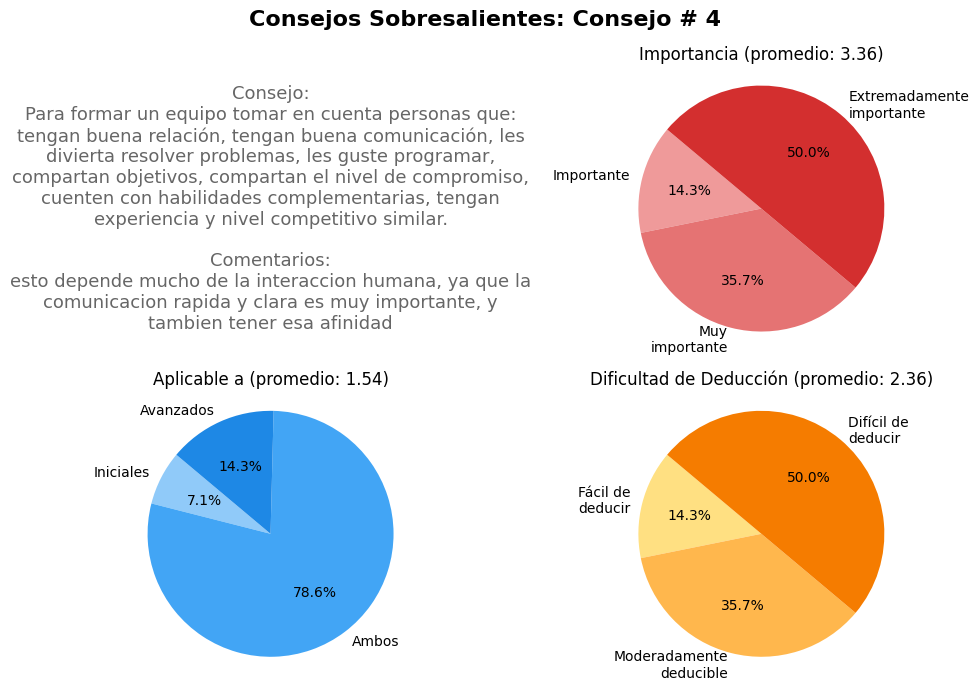

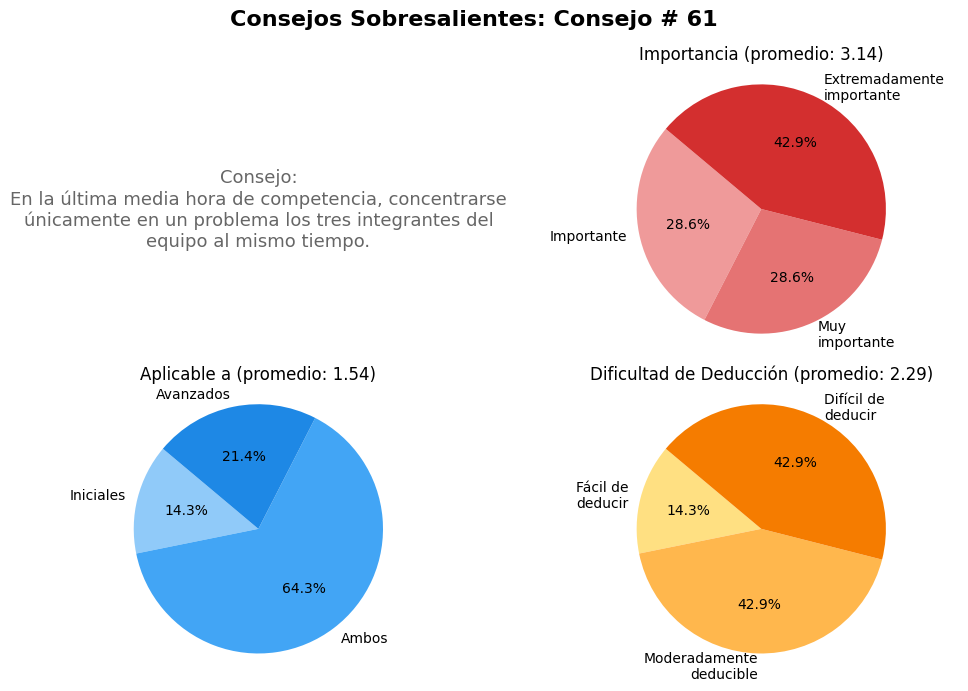

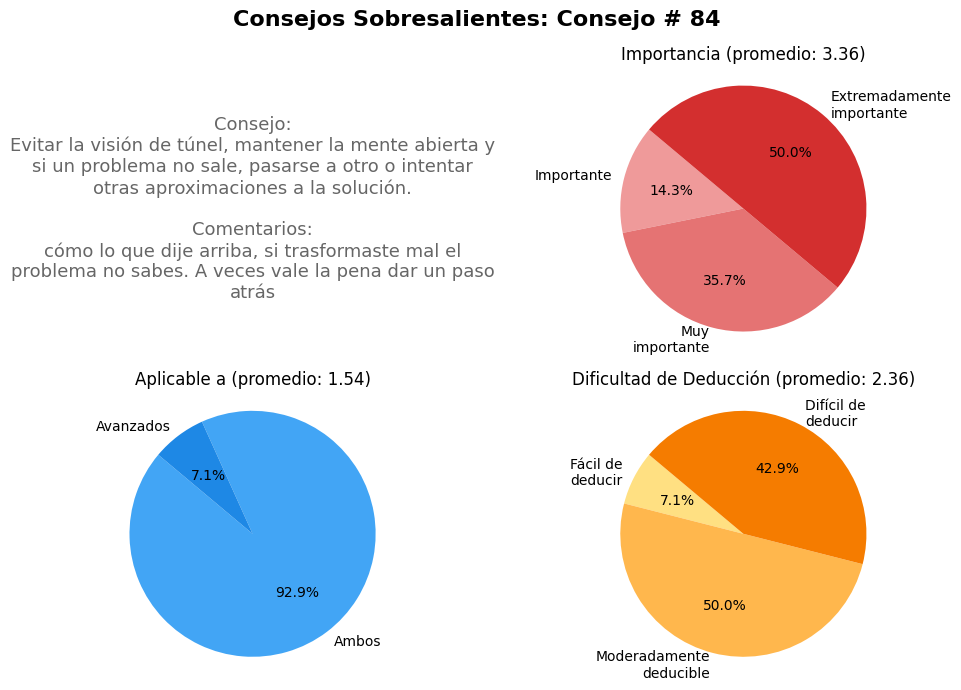

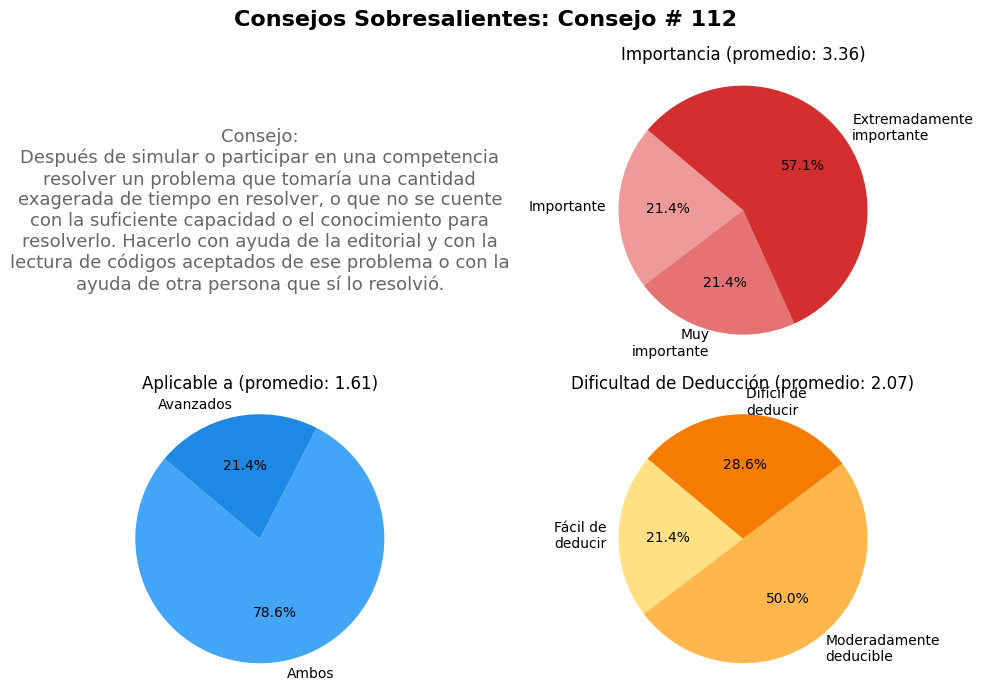

In [14]:
plot_filtered_advice(advice_data, 3.07, 4, 2.07, 3, 1, 2, graficar=True)

--- Consejos Sobresalientes (ordenados por aplicabilidad ascendente) ---

Rango de Importancia: [2.79, 4]
Rango de Dificultad: [1.93, 3]
Rango de Aplicabilidad: [1, 2]

Total de consejos sobresalientes: 15

Consejo #109:
- Importancia promedio: 2.93
- Dificultad promedio : 2.43
- Aplicabilidad promedio: 1.39
- Texto   : No decepcionarse por tener un desempeño no deseado en alguna competencia.

Consejo #110:
- Importancia promedio: 2.93
- Dificultad promedio : 2.07
- Aplicabilidad promedio: 1.54
- Texto   : Después de una simulación o competencia oficial, discutir con el equipo qué se hizo bien, qué se hizo mal y qué se puede mejorar, también evaluar el desempeño de las estrategias aplicadas.

Consejo #4:
- Importancia promedio: 3.36
- Dificultad promedio : 2.36
- Aplicabilidad promedio: 1.54
- Texto   : Para formar un equipo tomar en cuenta personas que: tengan buena relación, tengan buena comunicación, les divierta resolver problemas, les guste programar, compartan objetivos, comparta

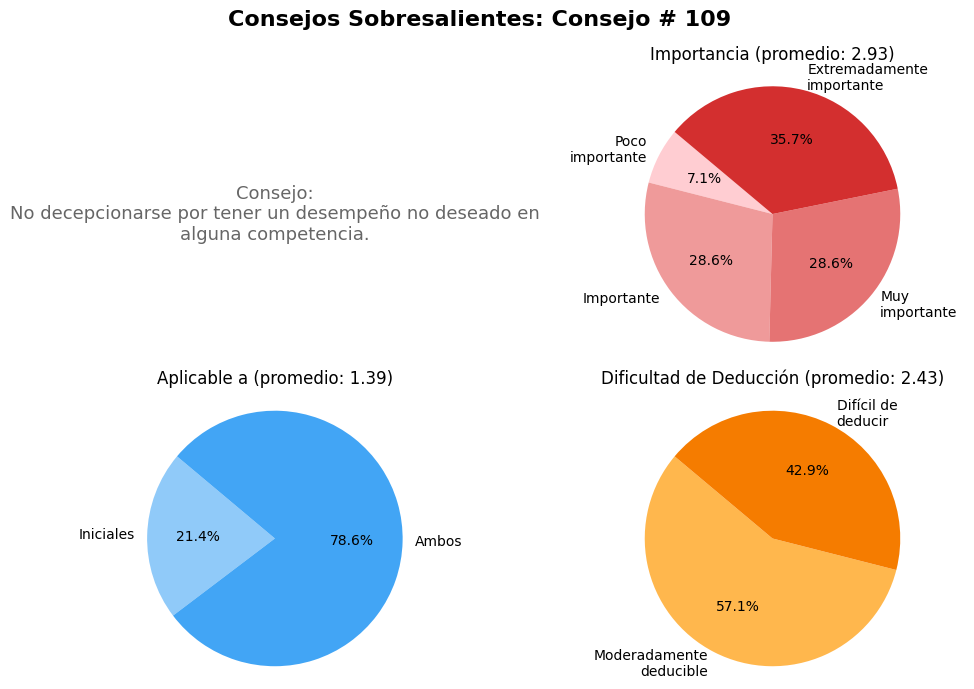

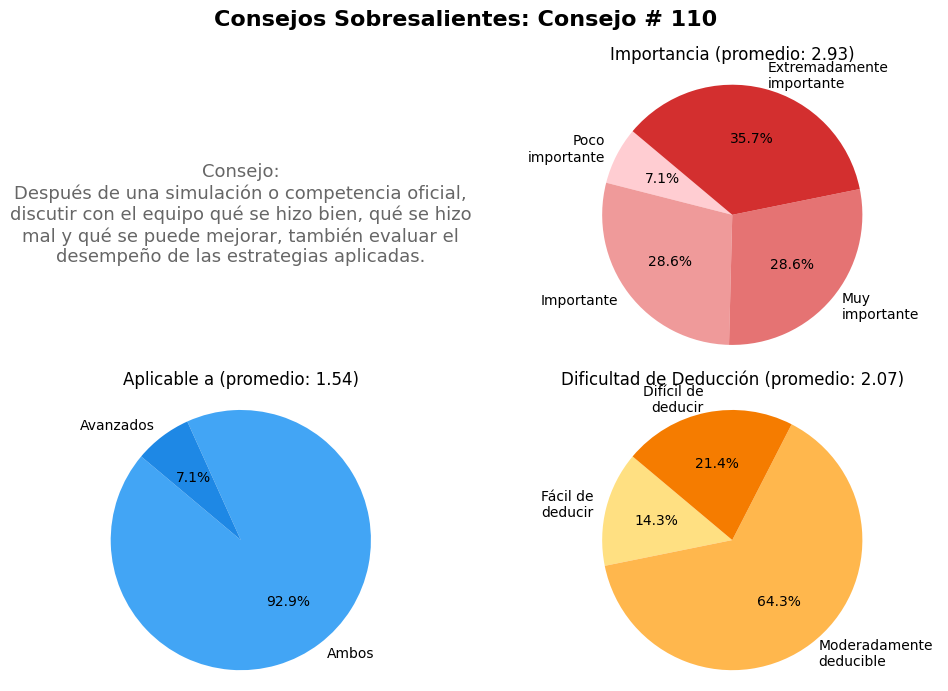

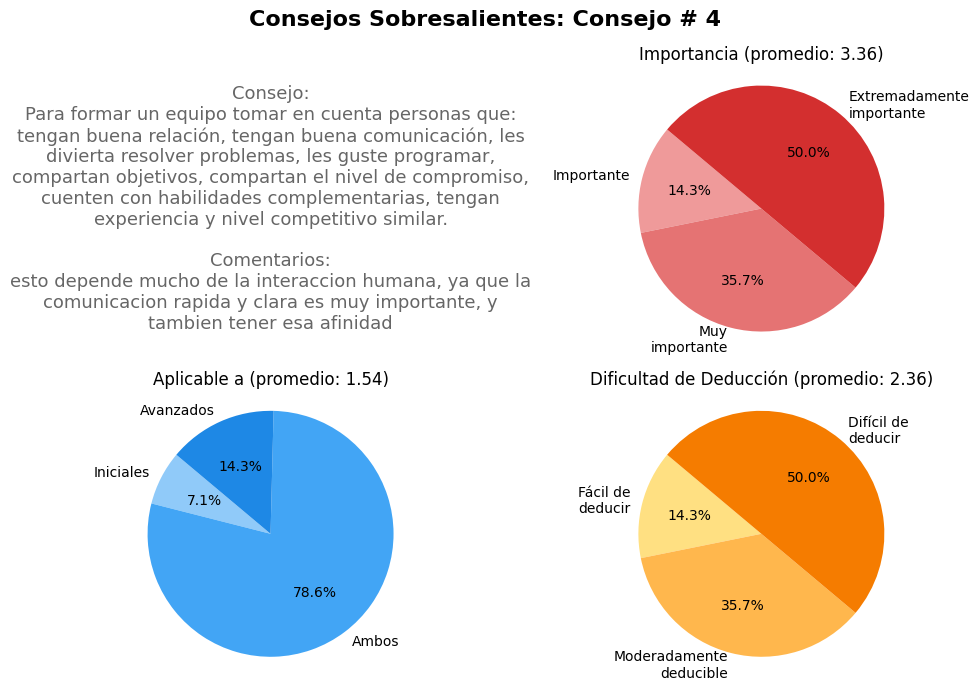

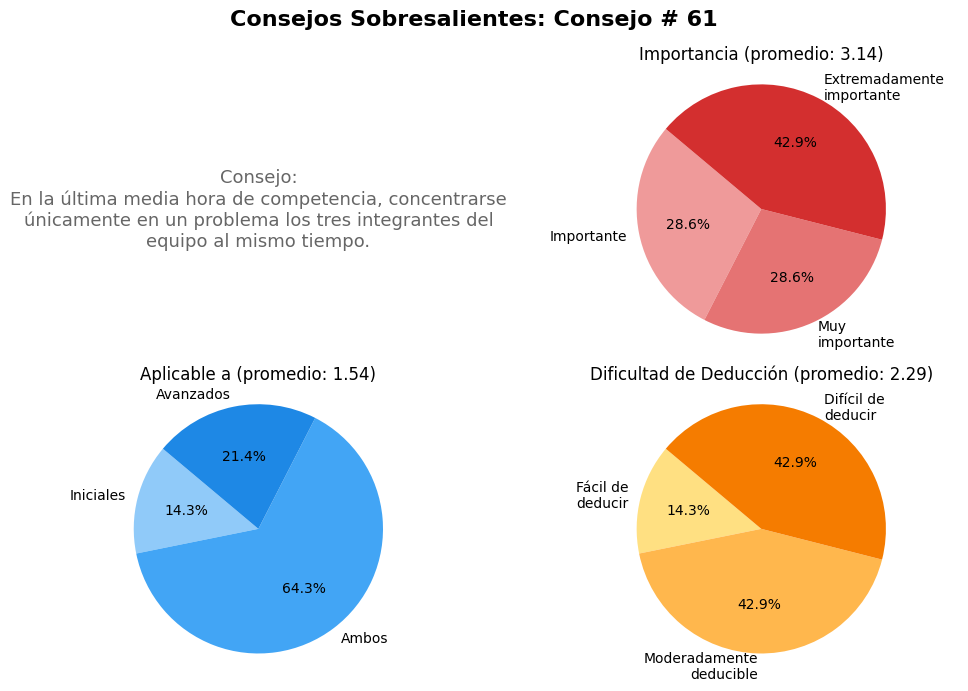

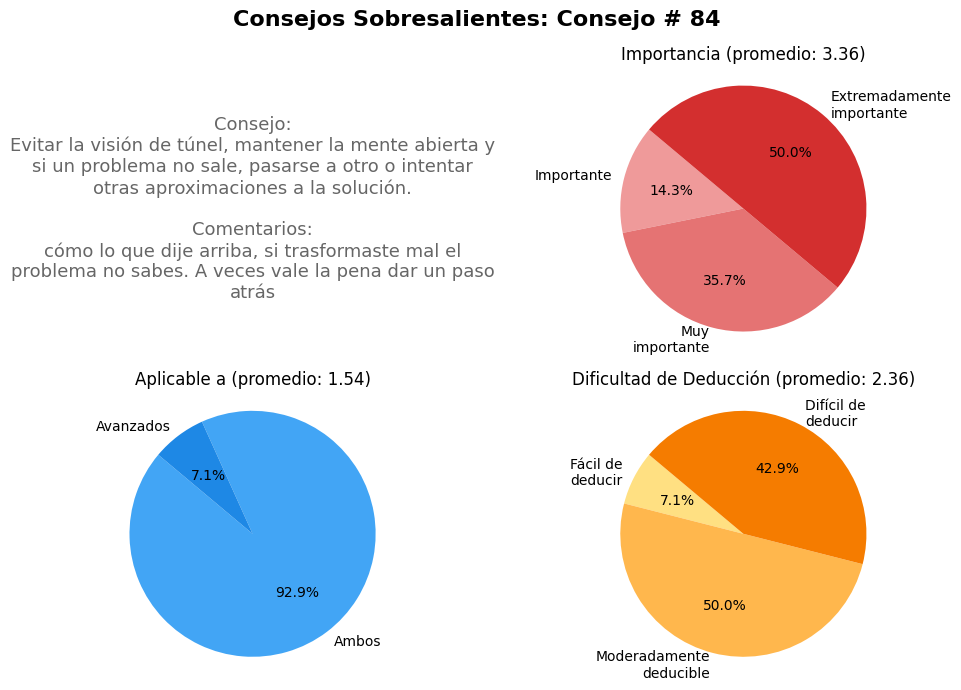

...

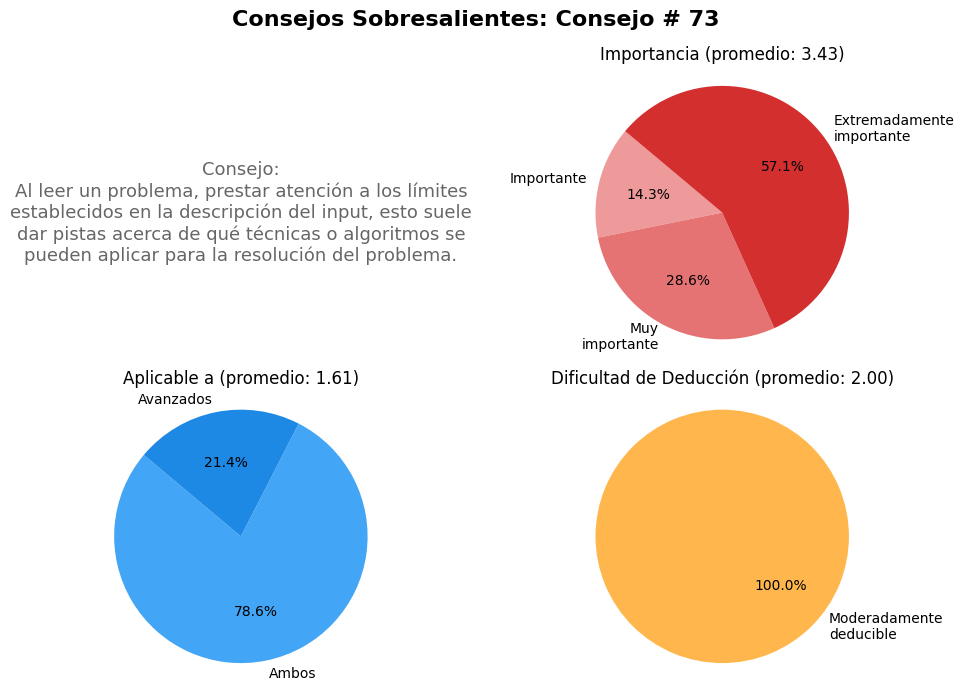

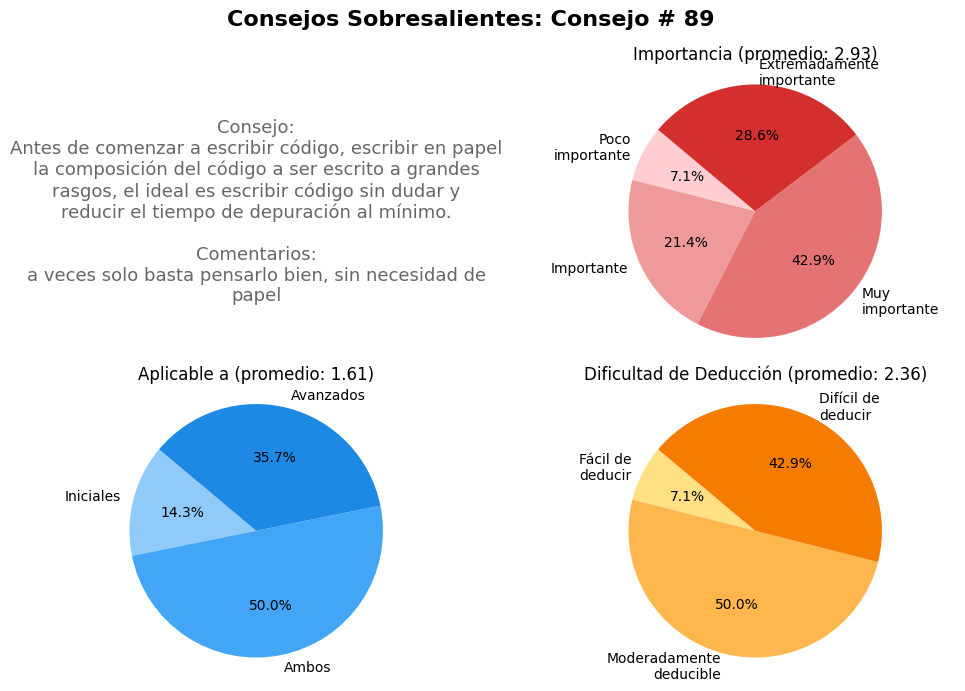

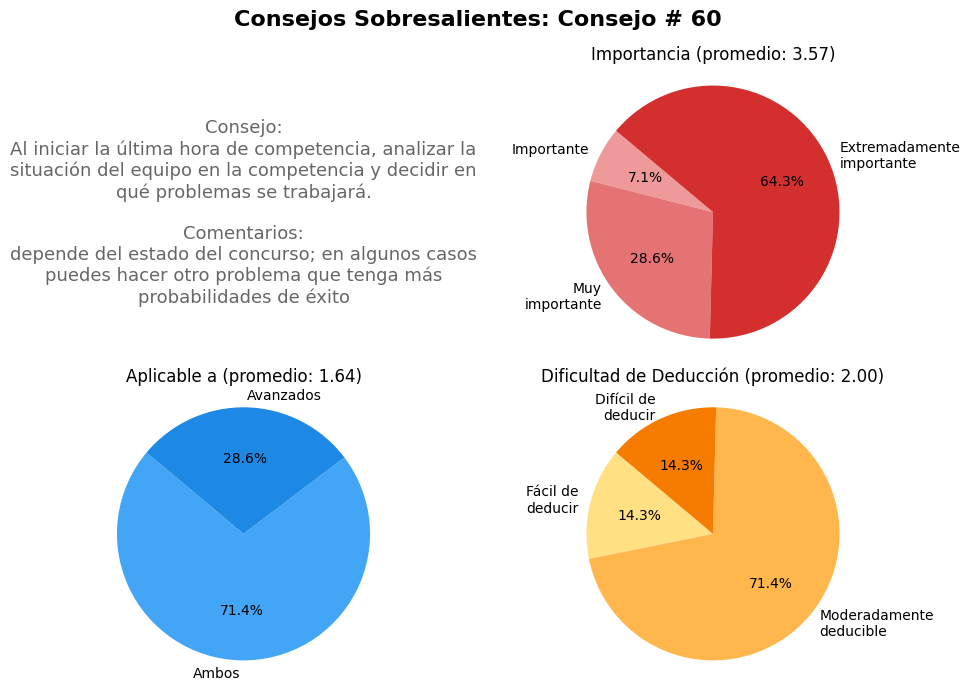

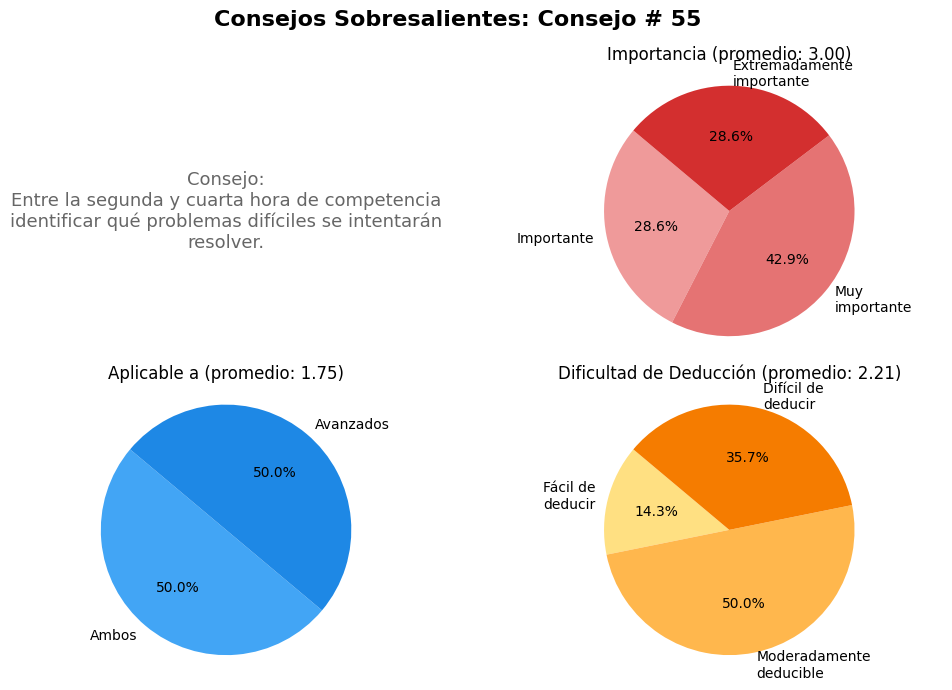

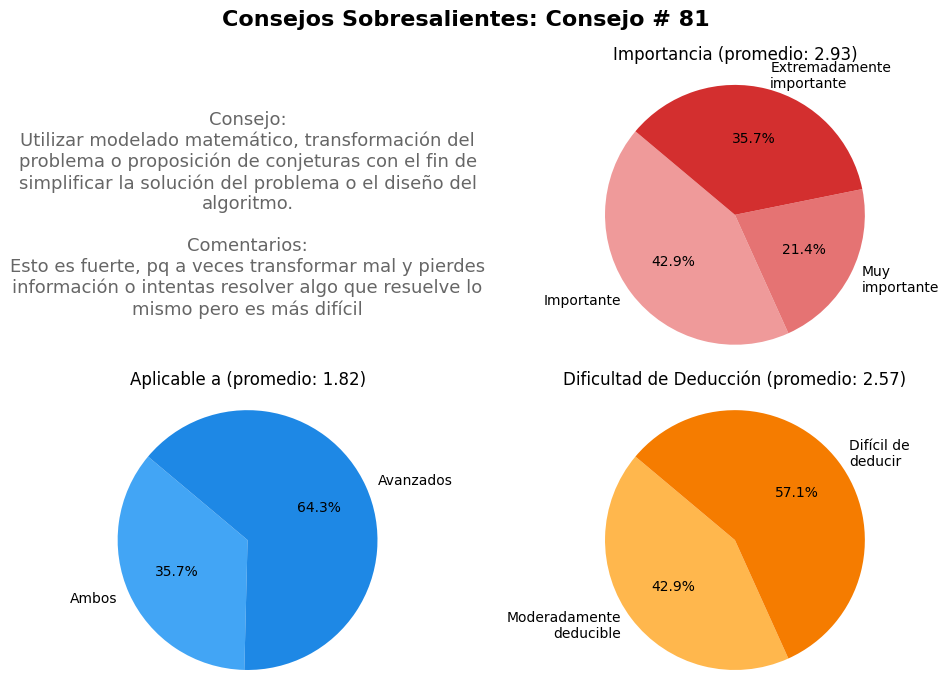

In [15]:
plot_filtered_advice(advice_data, 2.79, 4, 1.93, 3, 1, 2, graficar=True)

--- Resumen Top 10 Consejos (mayor Importancia) ---

Top 1 (mayor Importancia): Consejo #65
- Valores --> Importancia: 3.71, Dificultad: 1.86, Aplicabilidad: 1.50
- Texto   : No perder los estribos durante la competencia y siempre tratar de dar lo mejor de uno mismo.

Top 2 (mayor Importancia): Consejo #60
- Valores --> Importancia: 3.57, Dificultad: 2.00, Aplicabilidad: 1.64
- Texto   : Al iniciar la última hora de competencia, analizar la situación del equipo en la competencia y decidir en qué problemas se trabajará.
- Comentarios:
    • depende del estado del concurso; en algunos casos puedes hacer otro problema que tenga más probabilidades de éxito 

Top 3 (mayor Importancia): Consejo #64
- Valores --> Importancia: 3.57, Dificultad: 1.57, Aplicabilidad: 1.50
- Texto   : Evitar peleas y tonos defensivos entre compañeros de equipo.
- Comentarios:
    • es mame si es importante 

Top 4 (mayor Importancia): Consejo #88
- Valores --> Importancia: 3.50, Dificultad: 1.79, Aplicabilidad: 1

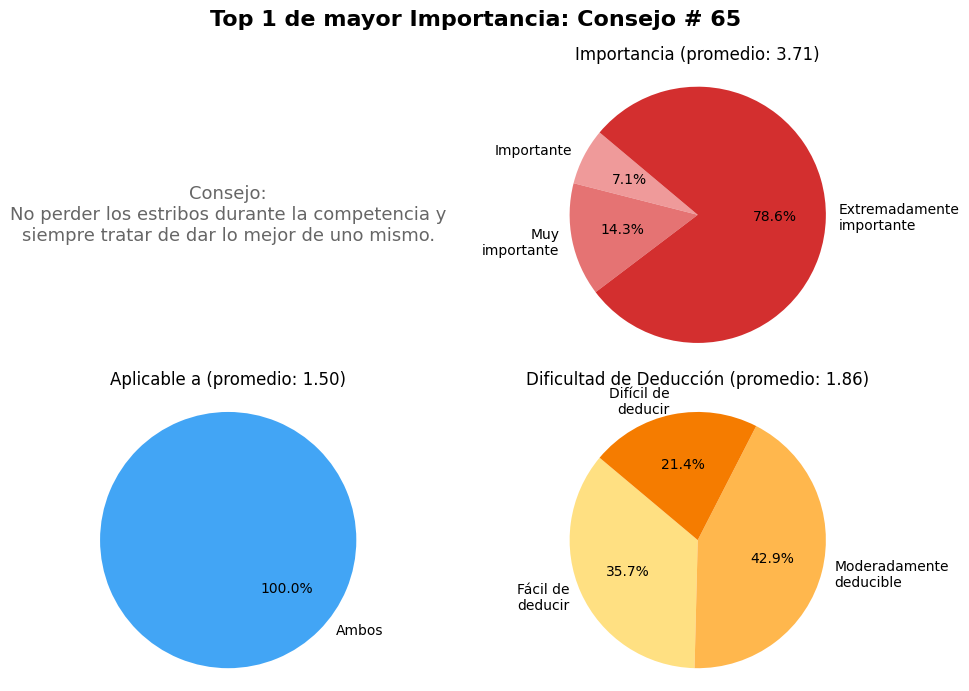

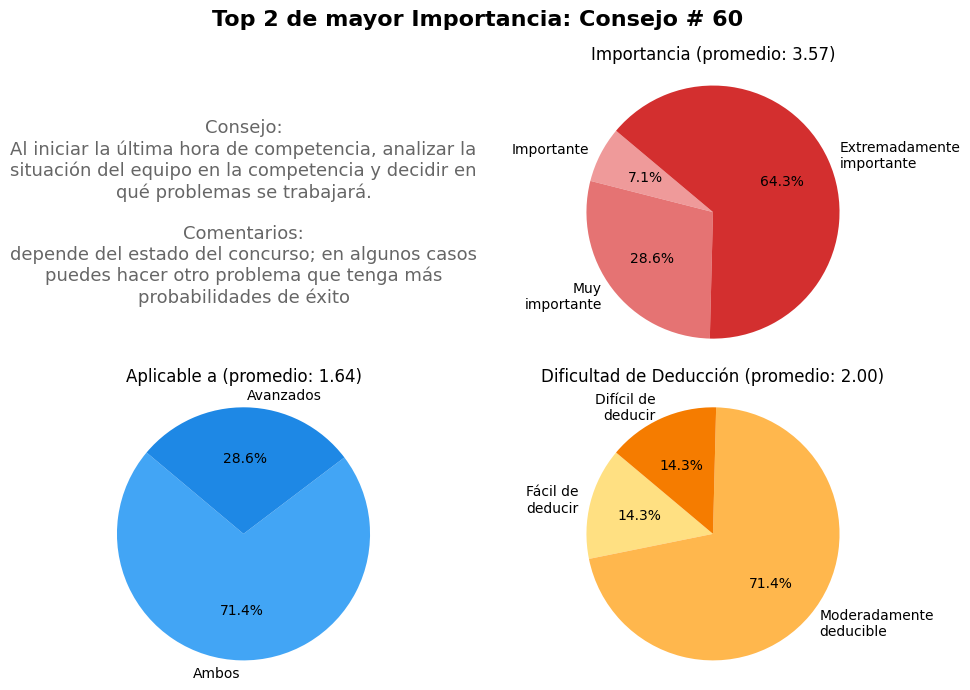

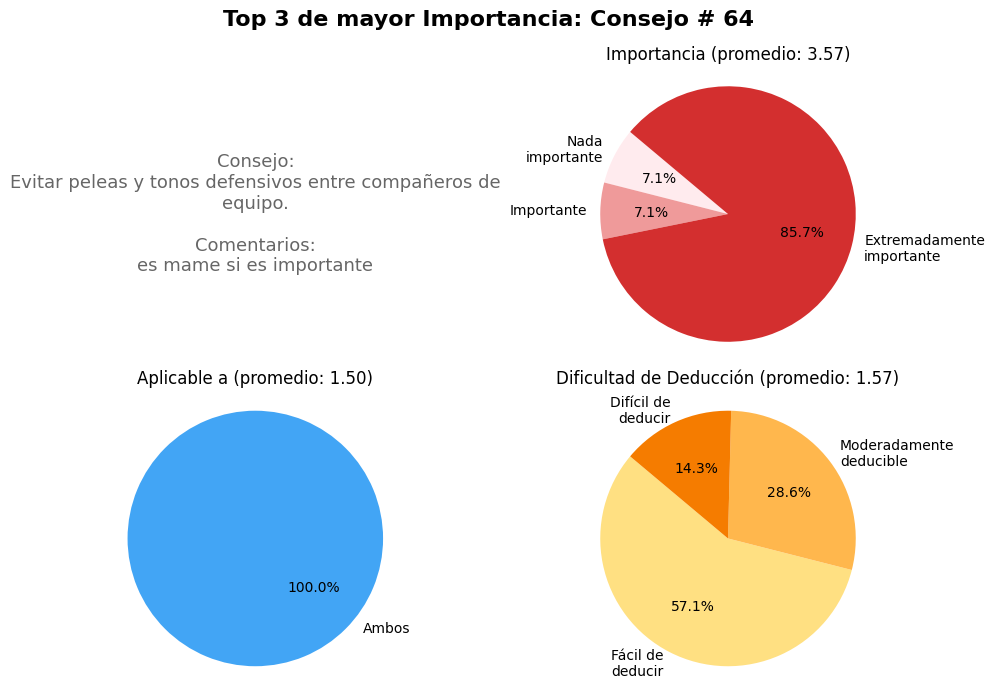

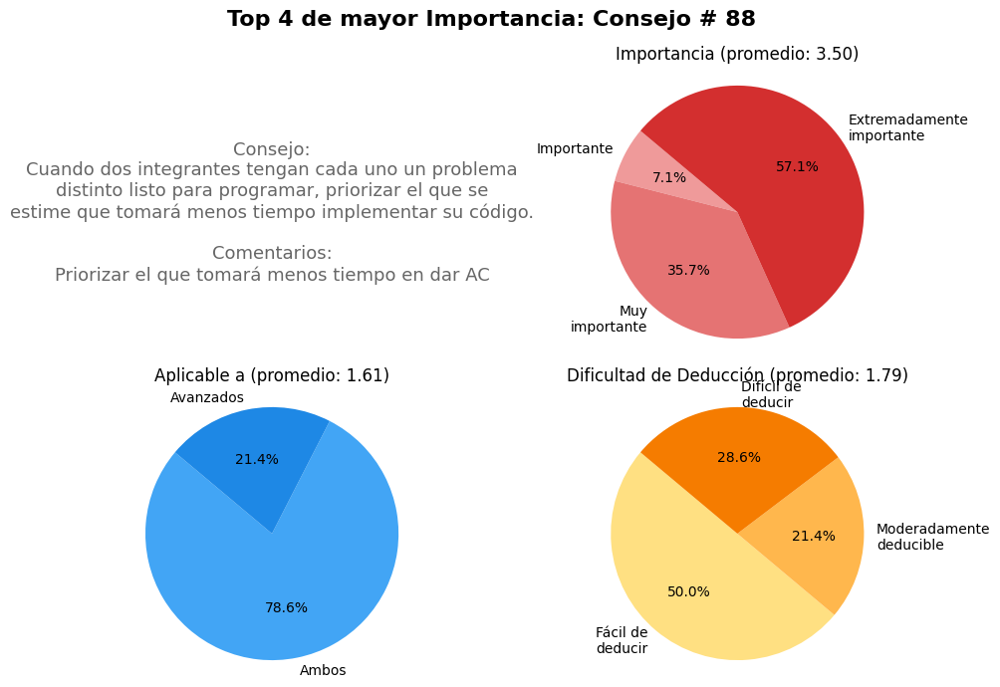

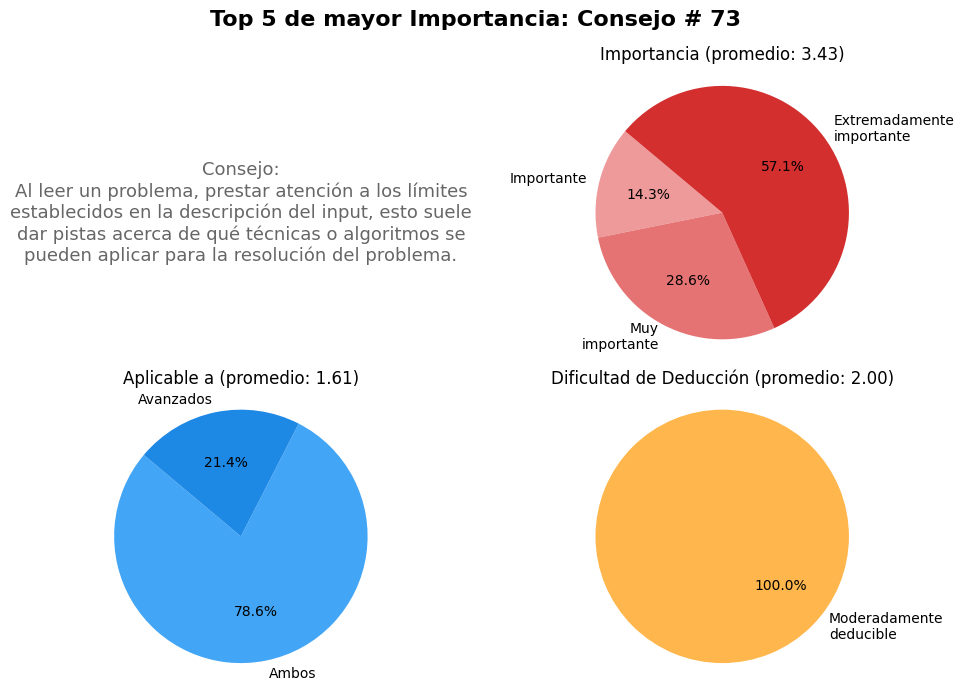

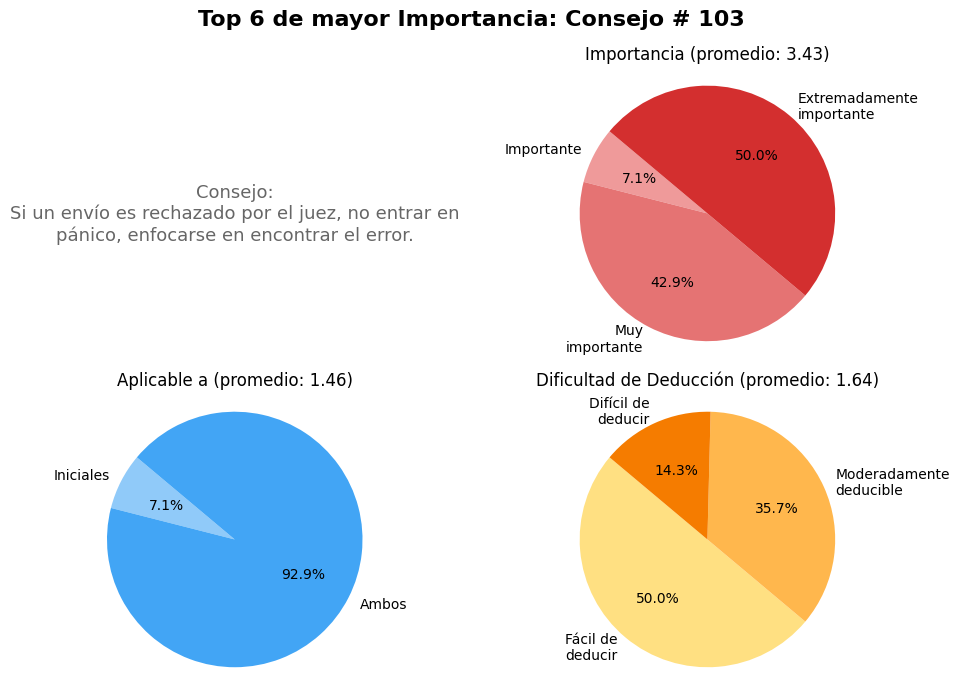

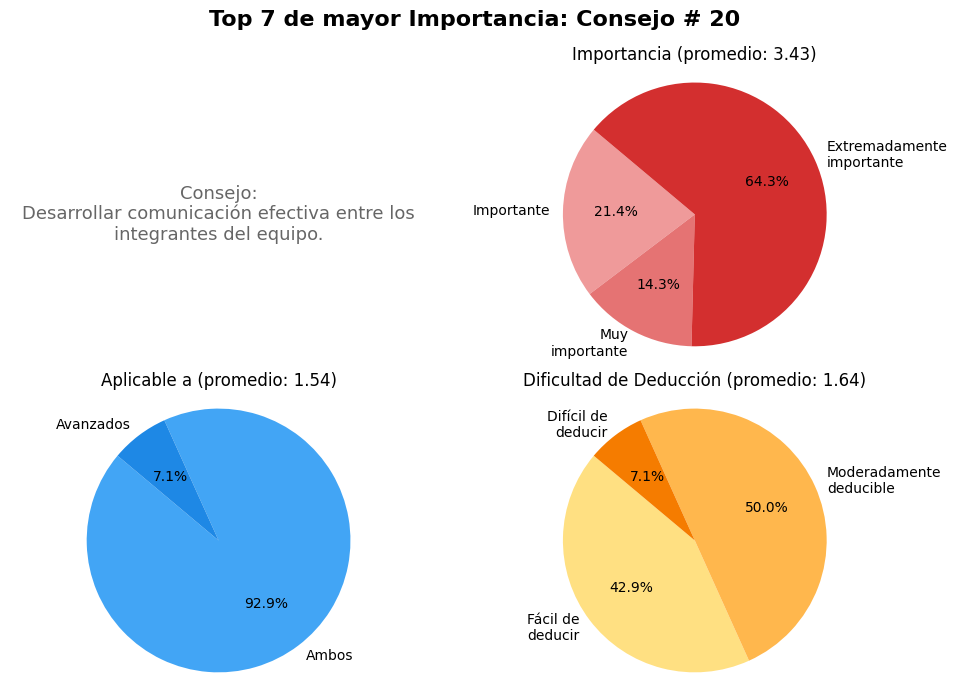

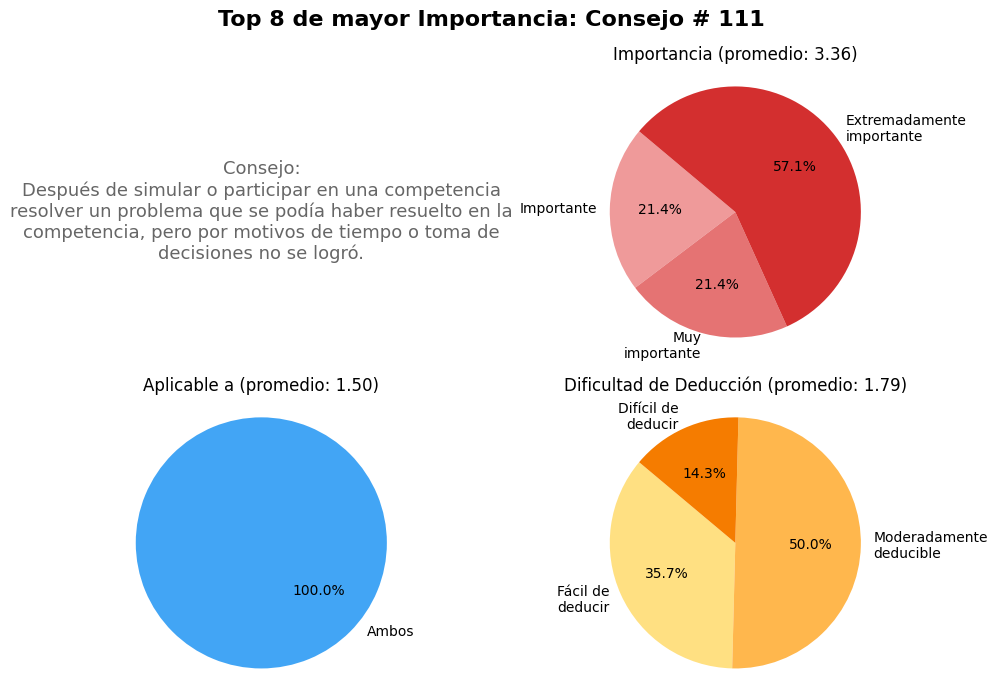

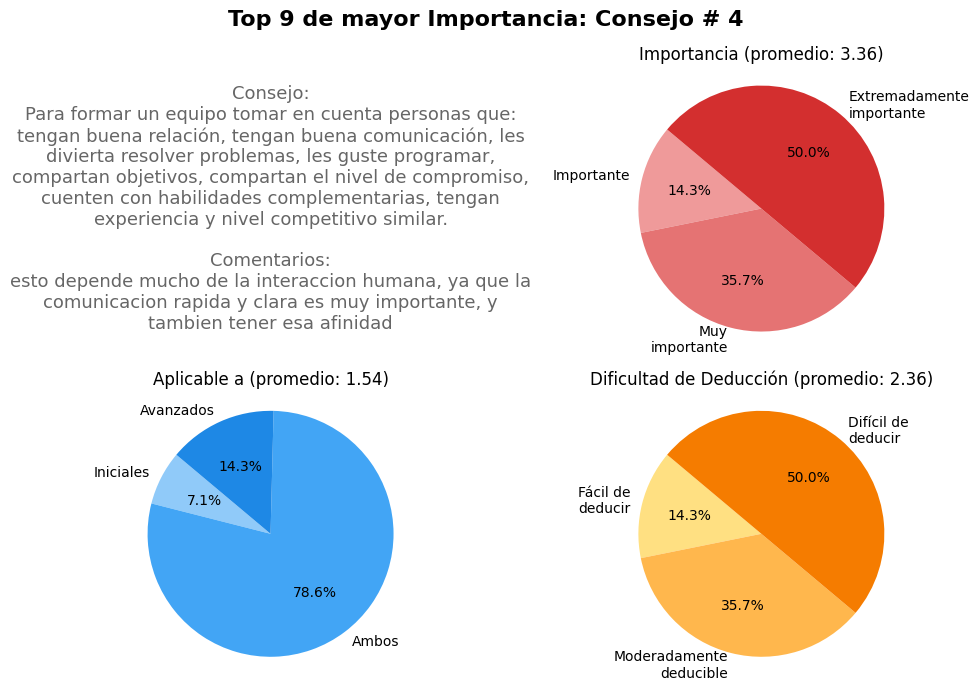

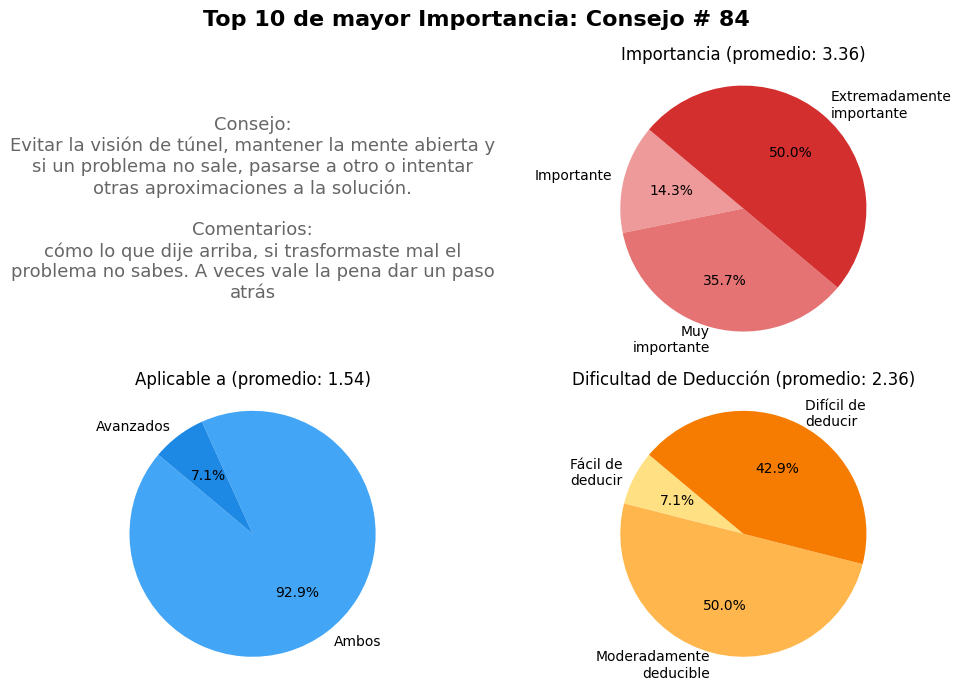

In [16]:
plot_top10_advice(advice_data, metric='Importancia Promedio', extreme="highest")

--- Resumen Top 10 Consejos (mayor Dificultad) ---

Top 1 (mayor Dificultad): Consejo #30
- Valores --> Importancia: 2.50, Dificultad: 2.71, Aplicabilidad: 1.82
- Texto   : En el equipo contar con al menos 2 expertos en cada área, para evitar una sobrecarga de trabajo y tener el respaldo necesario en momentos críticos.

Top 2 (mayor Dificultad): Consejo #44
- Valores --> Importancia: 2.07, Dificultad: 2.64, Aplicabilidad: 1.65
- Texto   : Realizar prácticas de lectura de problemas en equipo al simular competencias: al inicio leer todos los problemas sin resolver ninguno, discutir las dificultades de cada uno, comparar las predicciones con el scoreboard y luego continuar con la simulación.

Top 3 (mayor Dificultad): Consejo #81
- Valores --> Importancia: 2.93, Dificultad: 2.57, Aplicabilidad: 1.82
- Texto   : Utilizar modelado matemático, transformación del problema o proposición de conjeturas con el fin de simplificar la solución del problema o el diseño del algoritmo. 
- Comentarios:


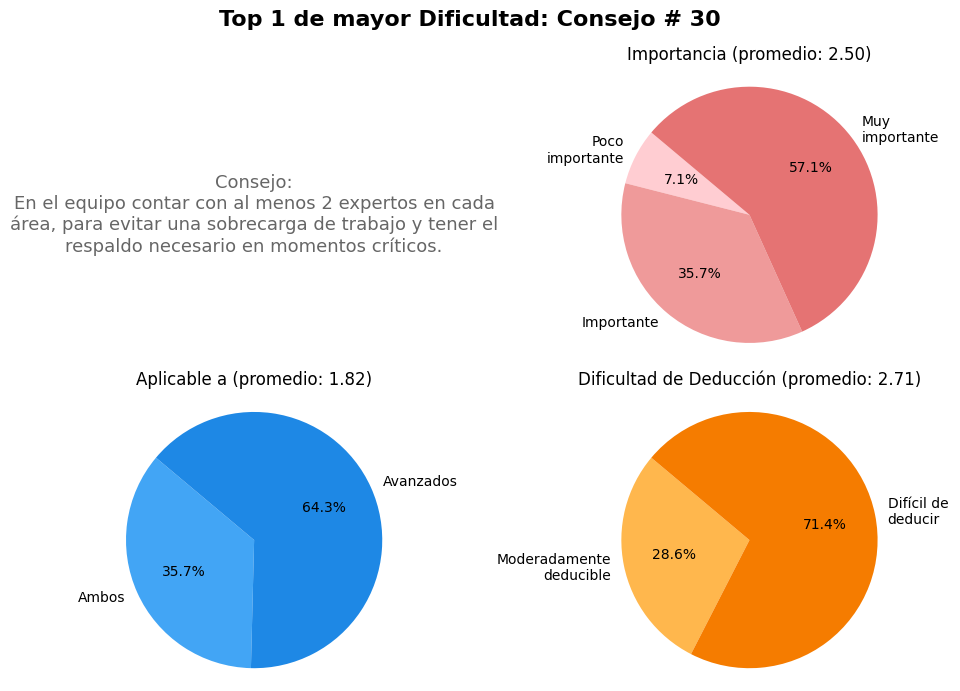

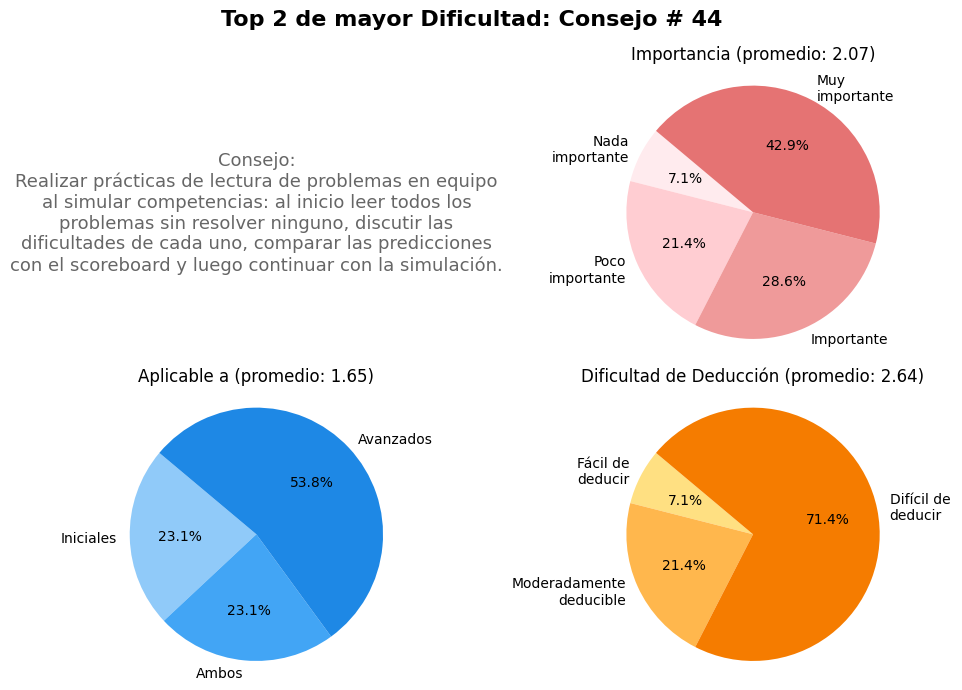

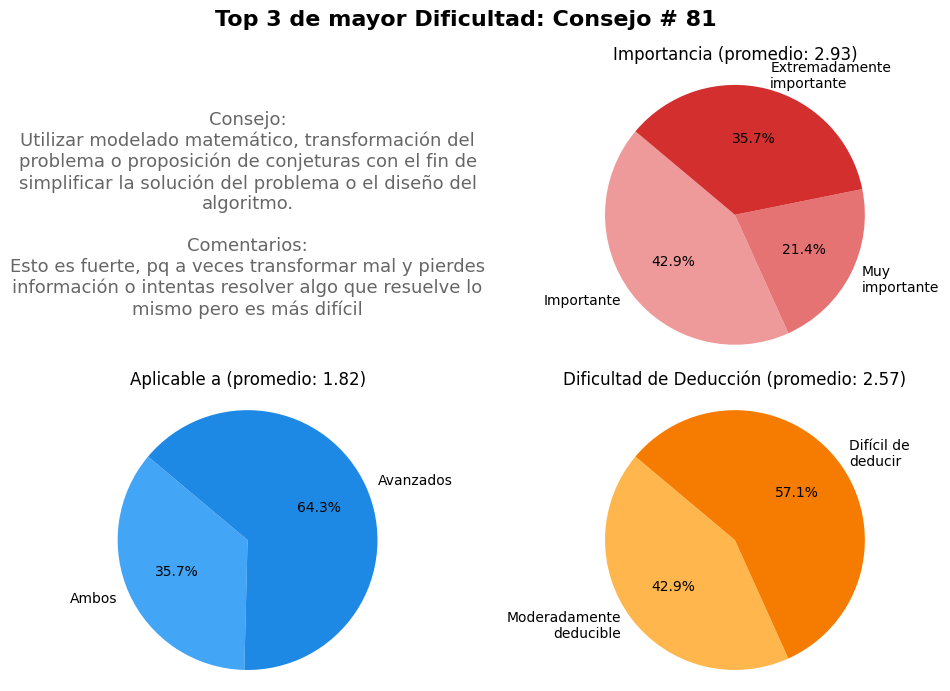

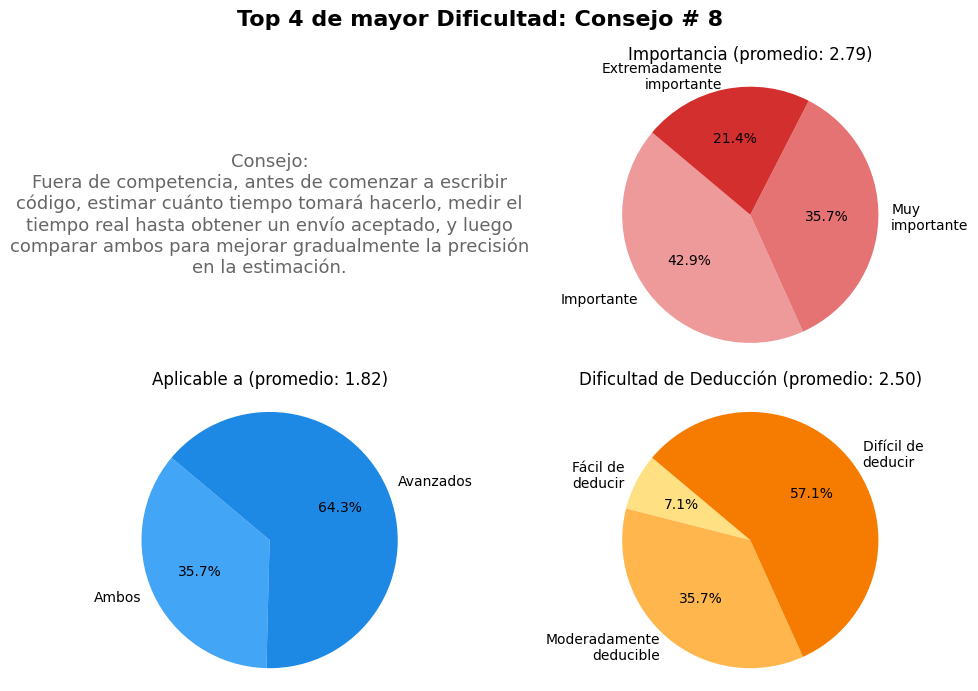

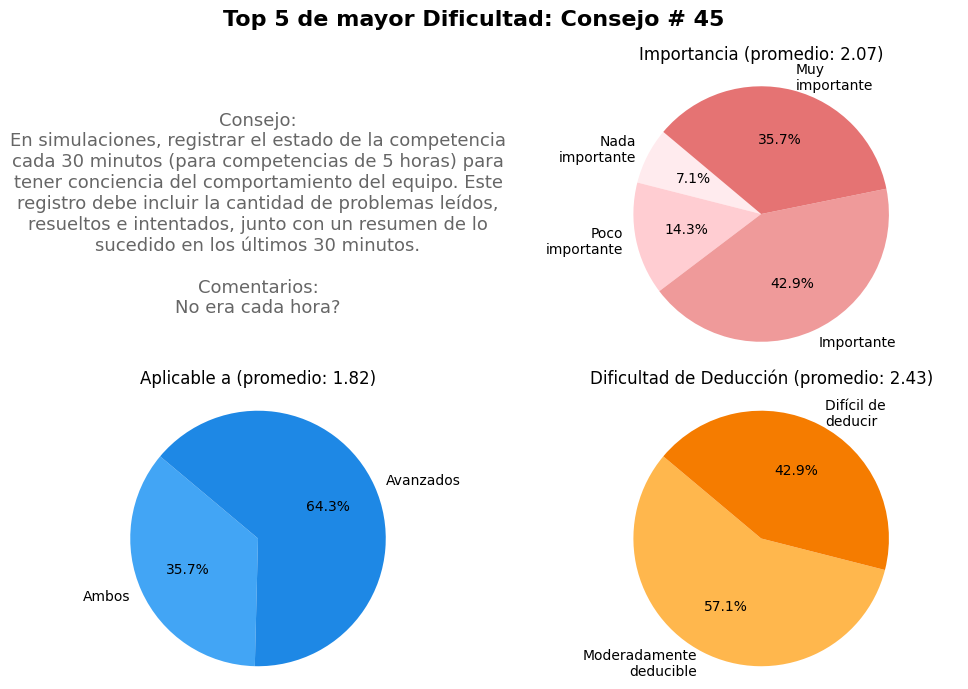

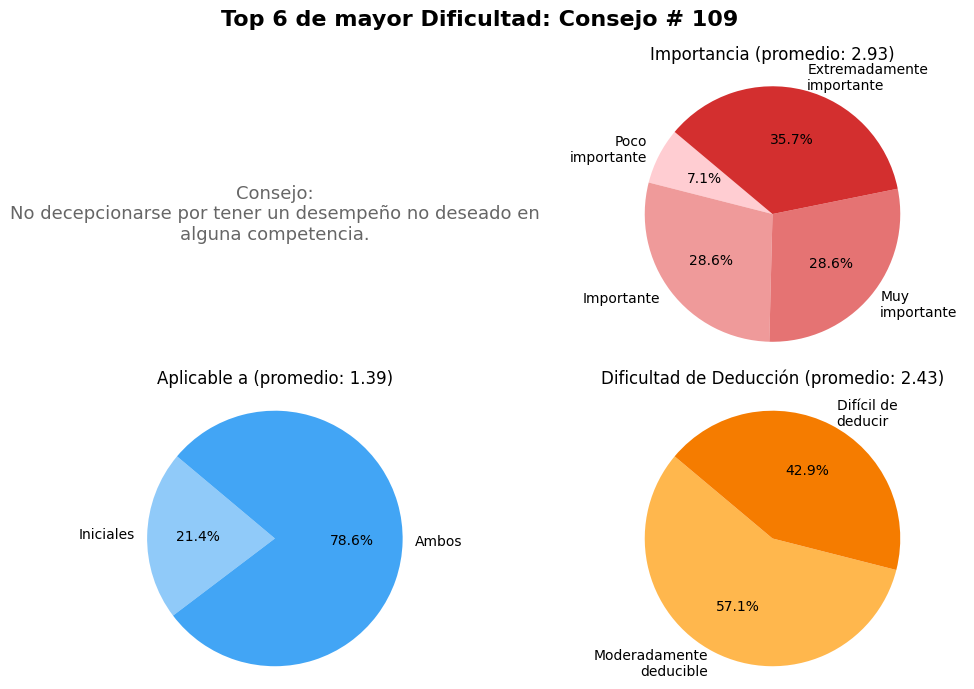

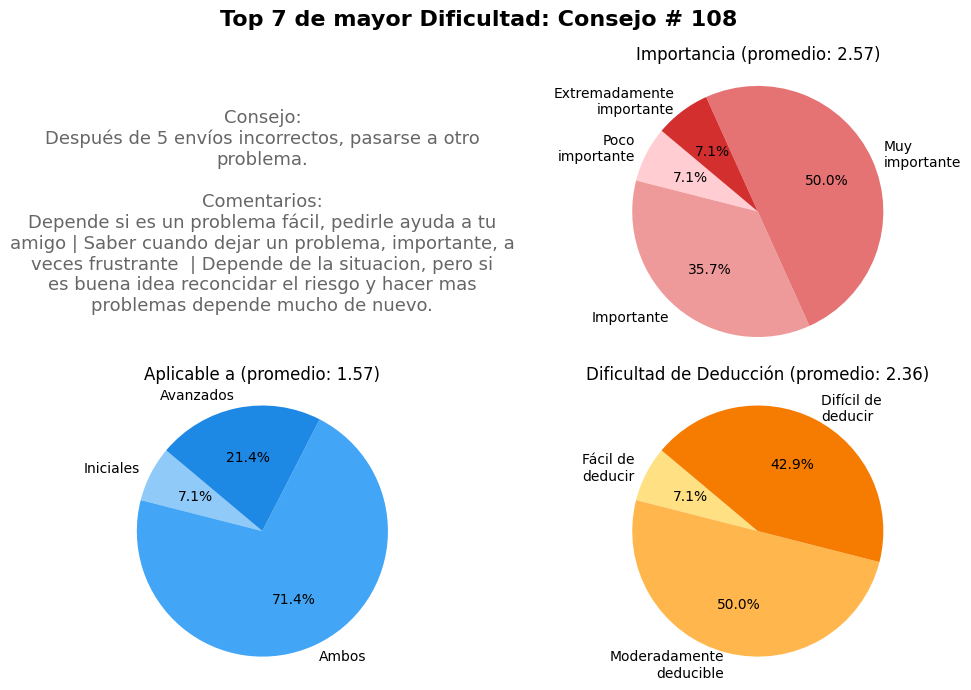

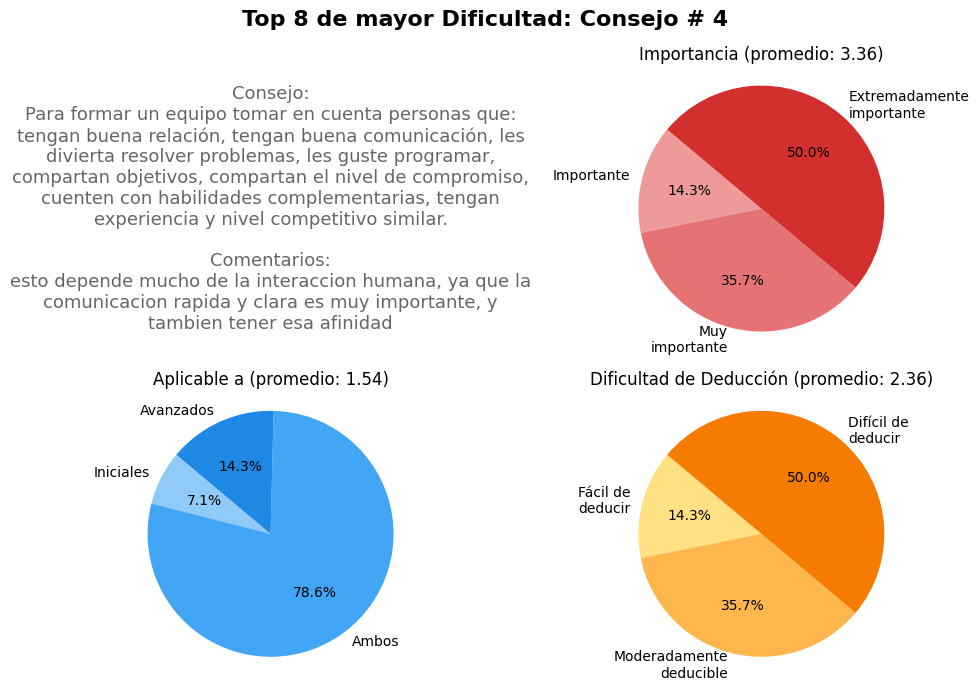

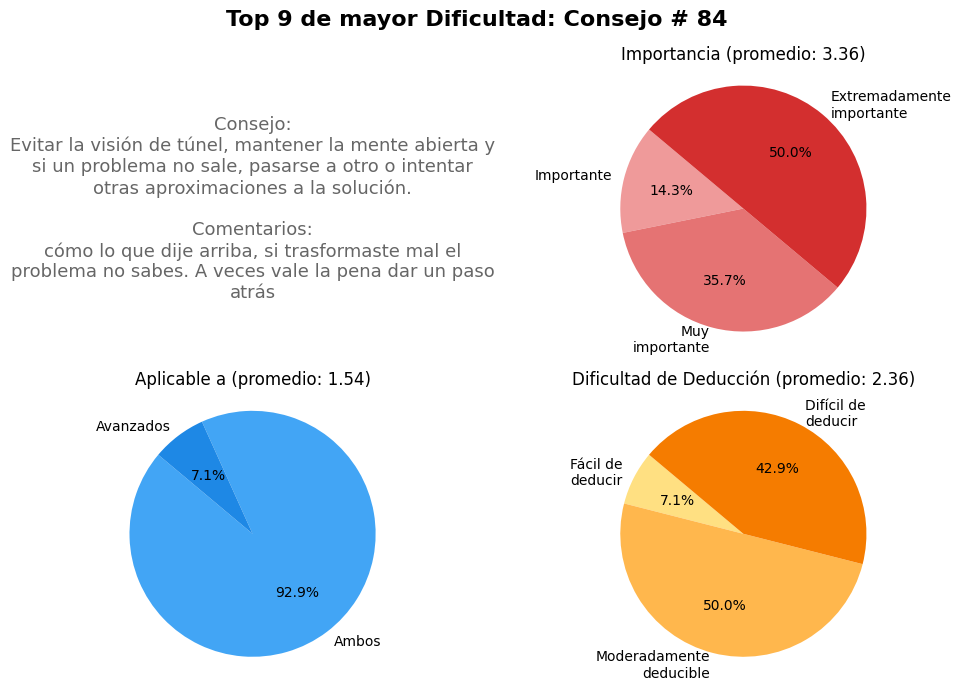

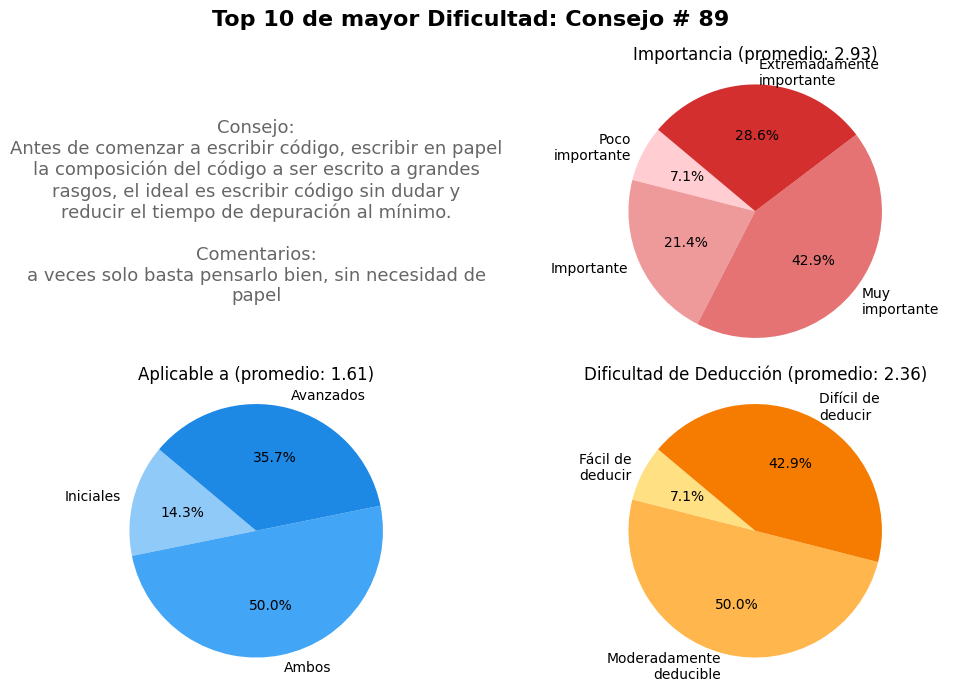

In [17]:
plot_top10_advice(advice_data, metric='Dificultad de Deducción Promedio', extreme="highest")

--- Resumen Top 10 Consejos (mayor Aplicabilidad) ---

Top 1 (mayor Aplicabilidad): Consejo #56
- Valores --> Importancia: 2.14, Dificultad: 2.29, Aplicabilidad: 1.86
- Texto   : Abordar los problemas difíciles desde más temprano si se estima que de esta forma se resolverá una mayor cantidad de problemas, estando conscientes de que eso conlleva el riesgo de una mayor penalidad por tiempo.
- Comentarios:
    • depende la estrategia
    • Depende de que tan arriesgado y confianza tiene el equipo
    • Esta es medio fuerte, tal vez si quieres ganar LATAM o la competencia es muy dura

Top 2 (mayor Aplicabilidad): Consejo #30
- Valores --> Importancia: 2.50, Dificultad: 2.71, Aplicabilidad: 1.82
- Texto   : En el equipo contar con al menos 2 expertos en cada área, para evitar una sobrecarga de trabajo y tener el respaldo necesario en momentos críticos.

Top 3 (mayor Aplicabilidad): Consejo #45
- Valores --> Importancia: 2.07, Dificultad: 2.43, Aplicabilidad: 1.82
- Texto   : En simulaciones

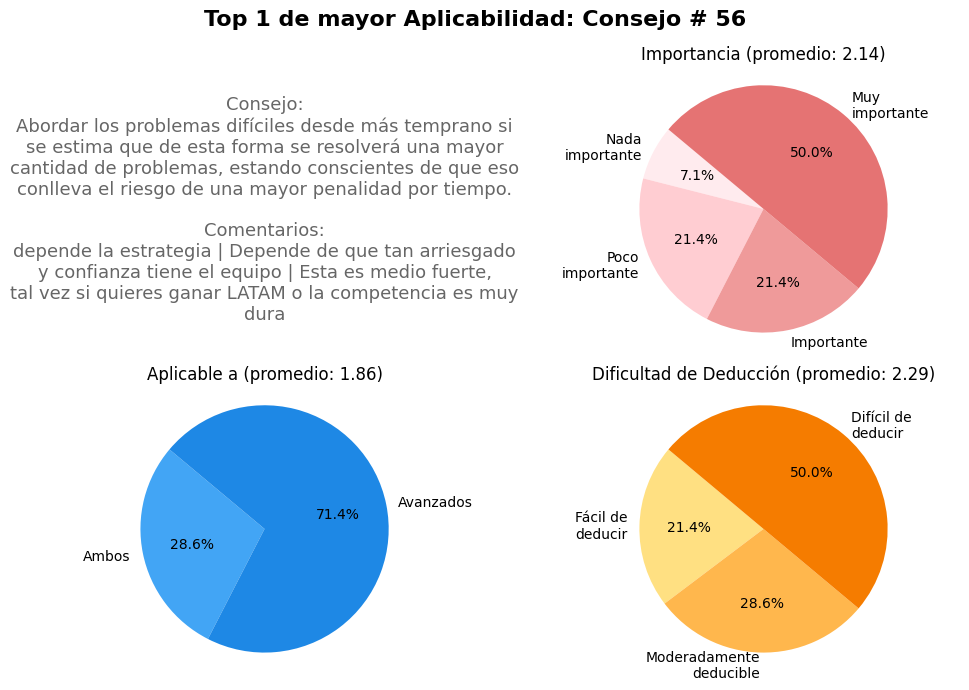

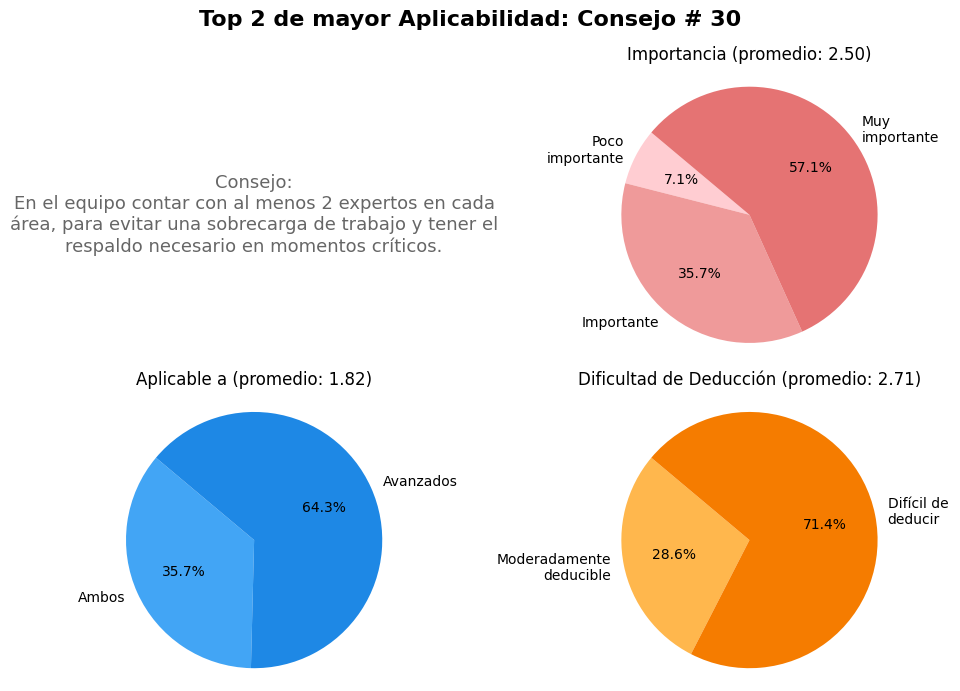

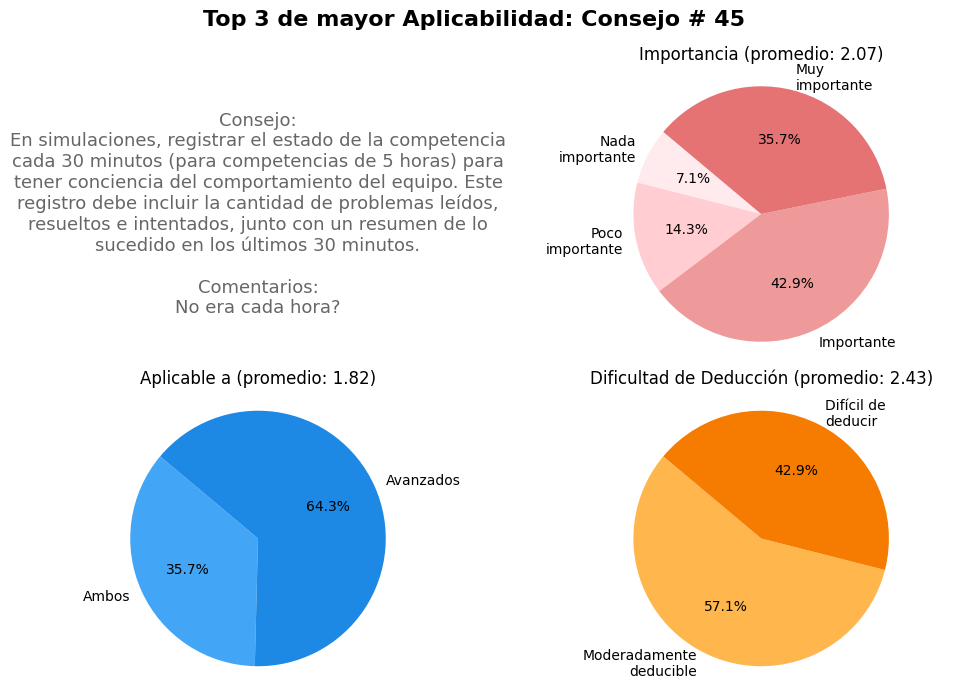

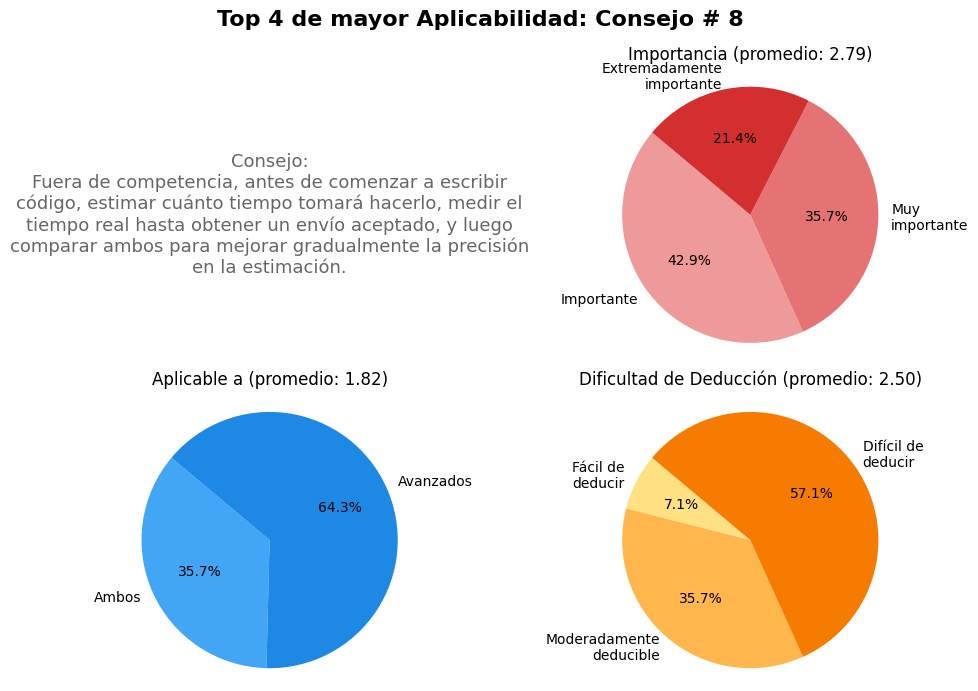

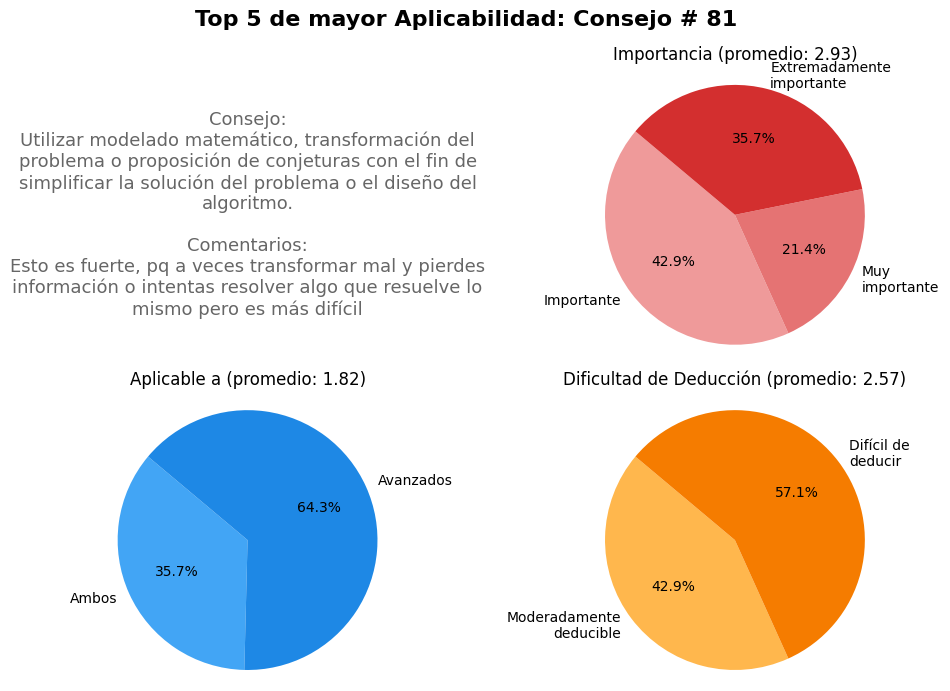

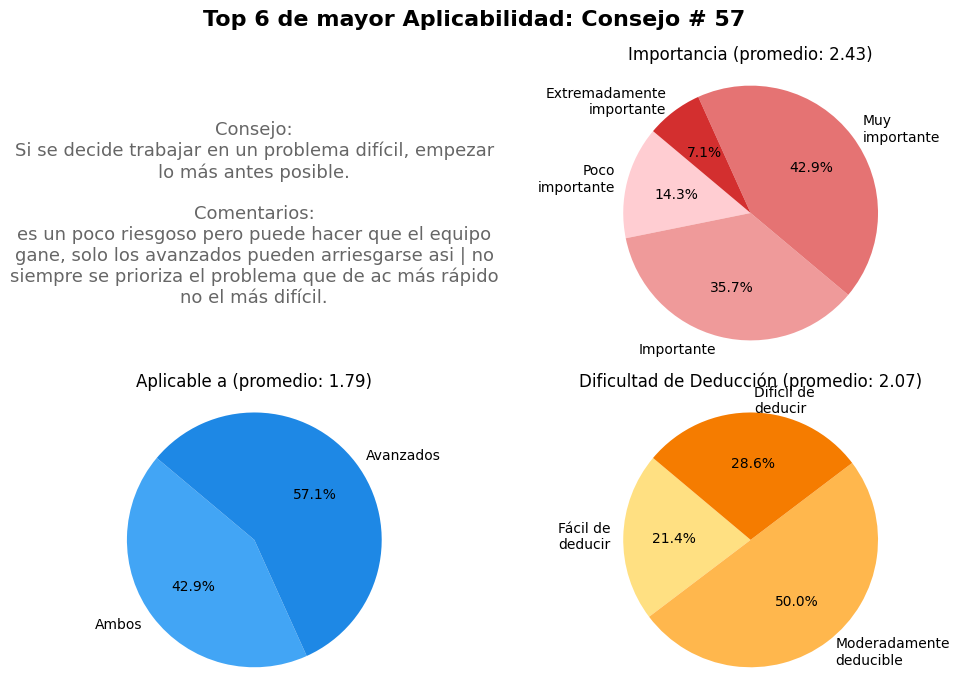

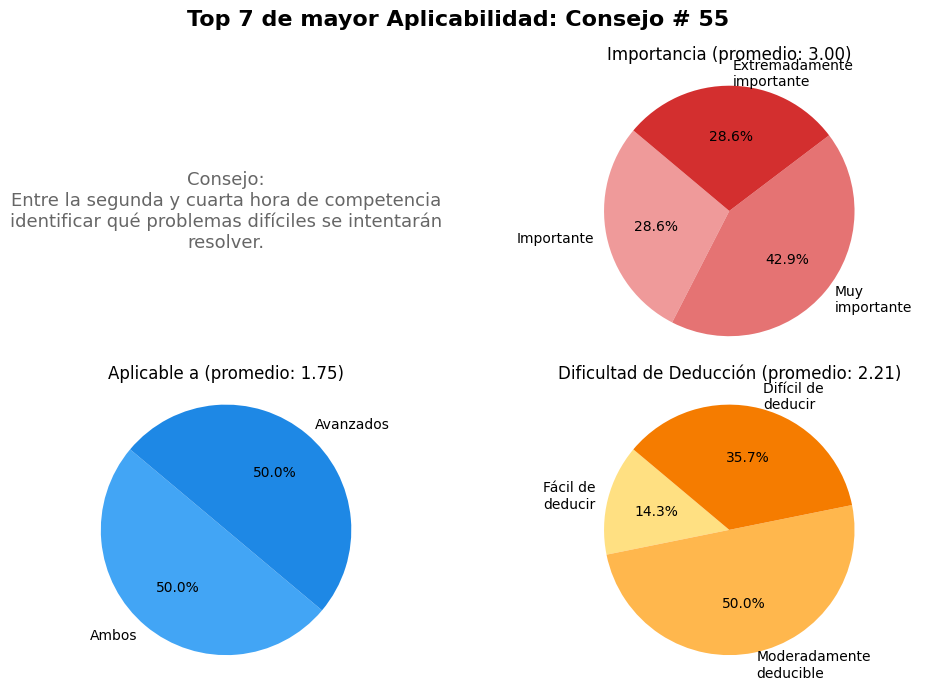

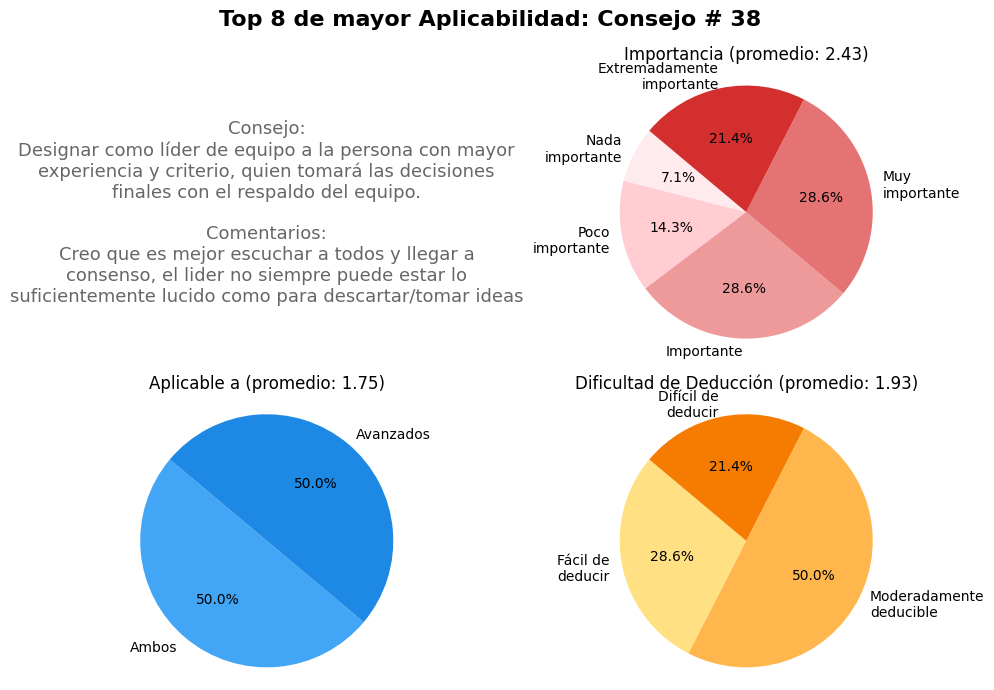

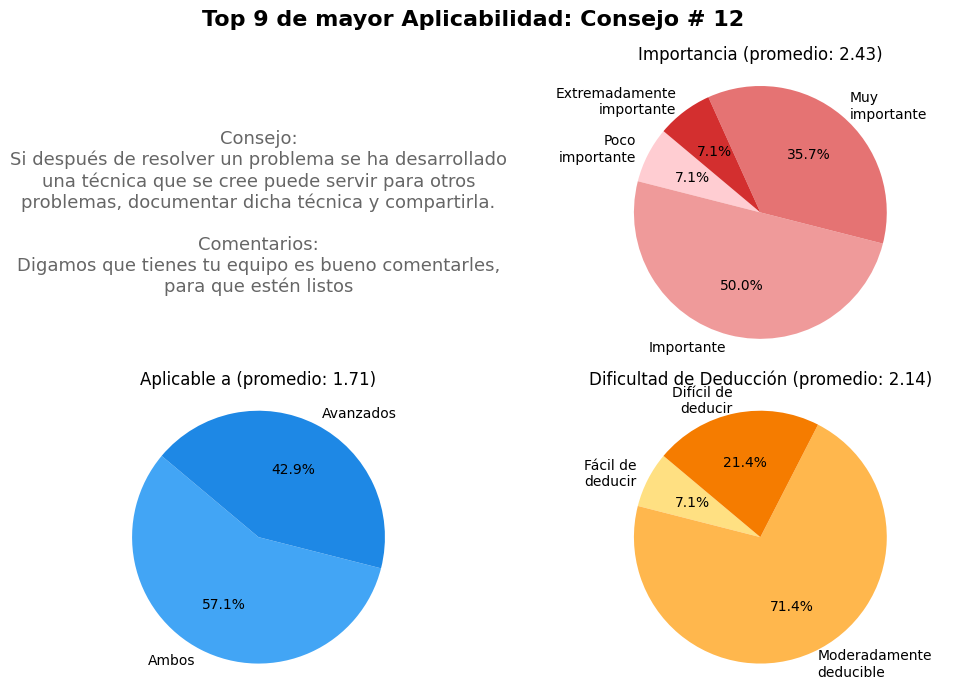

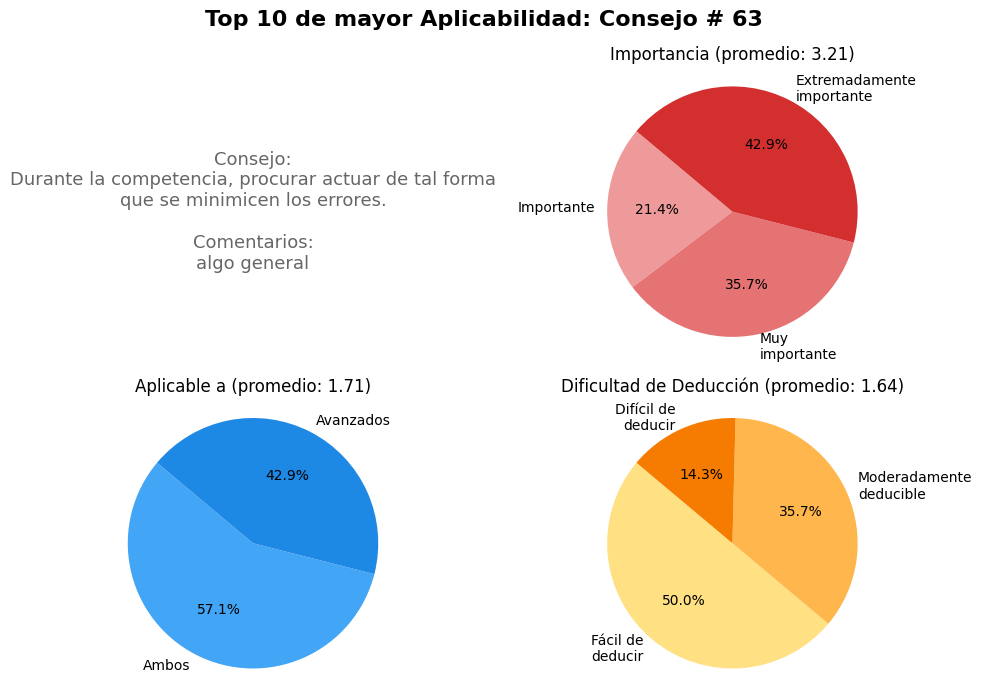

In [18]:
# Top 10 consejos con menor Aplicabilidad Promedio:
plot_top10_advice(advice_data, metric='Aplicabilidad Promedio', extreme="highest")

--- Resumen Top 10 Consejos (menor Aplicabilidad) ---

Top 1 (menor Aplicabilidad): Consejo #36
- Valores --> Importancia: 2.14, Dificultad: 1.36, Aplicabilidad: 1.21
- Texto   : Llevar un diccionario de bolsillo Inglés-Español a las competencias

Top 2 (menor Aplicabilidad): Consejo #3
- Valores --> Importancia: 2.07, Dificultad: 1.43, Aplicabilidad: 1.25
- Texto   : Conseguir algún libro base y leerlo de principio a fin.
- Comentarios:
    • depende del libro pregunta referencias para saber la dificultad 

Top 3 (menor Aplicabilidad): Consejo #1
- Valores --> Importancia: 3.36, Dificultad: 1.57, Aplicabilidad: 1.29
- Texto   : resolver gran cantidad de problemas fáciles e incrementar gradualmente la dificultad.
- Comentarios:
    • me parece importante esta practica para equipos y alumnos que no logran estar todo el tiempo entrenando esta practica ayuda a mantener agilidad en varios aspectos

Top 4 (menor Aplicabilidad): Consejo #2
- Valores --> Importancia: 2.57, Dificultad: 1.21, A

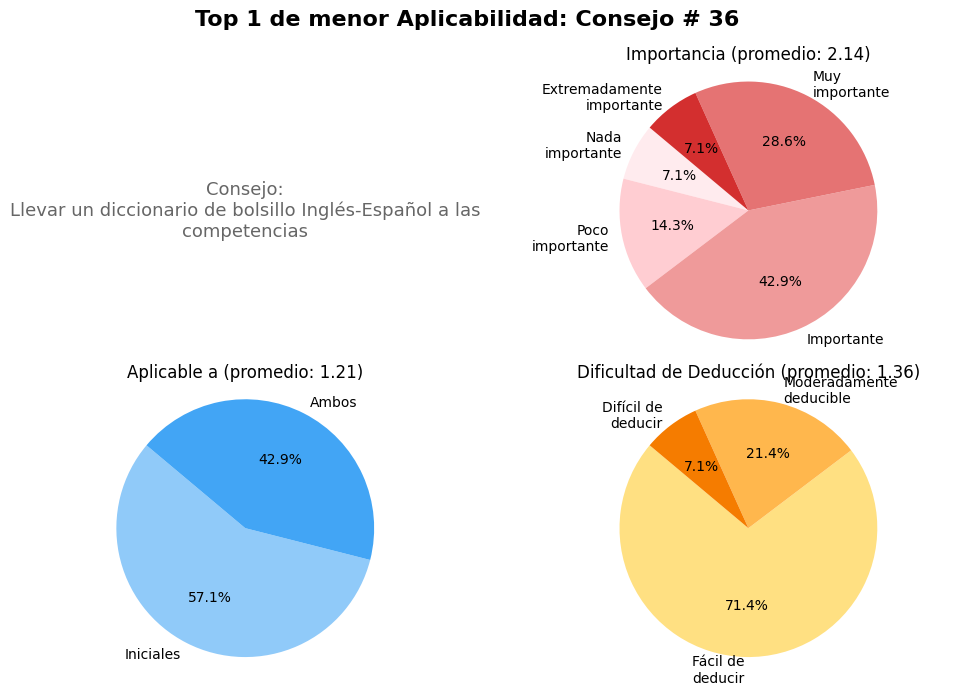

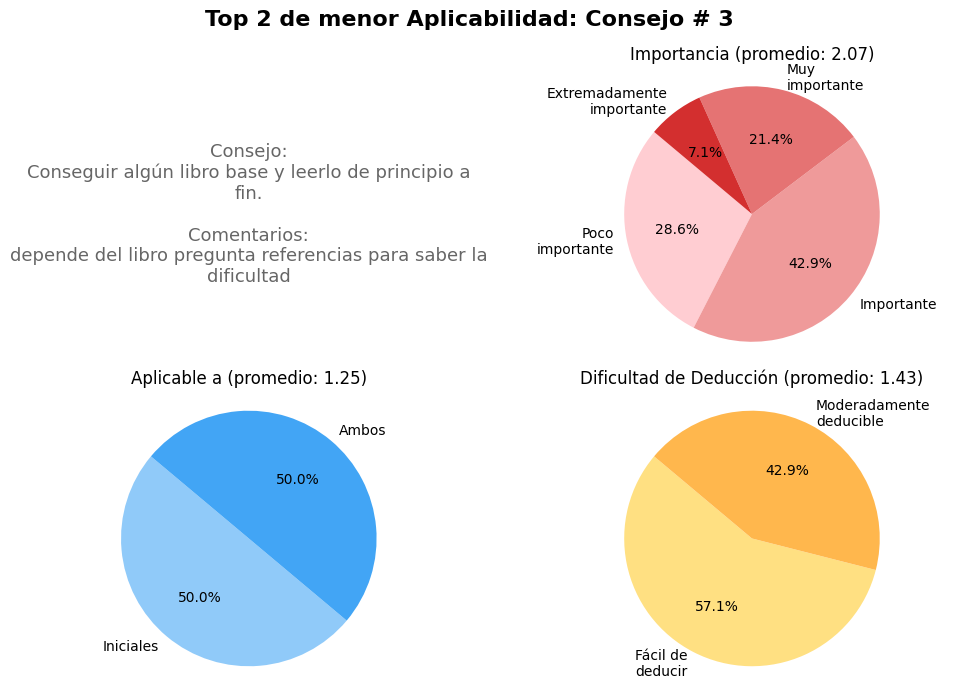

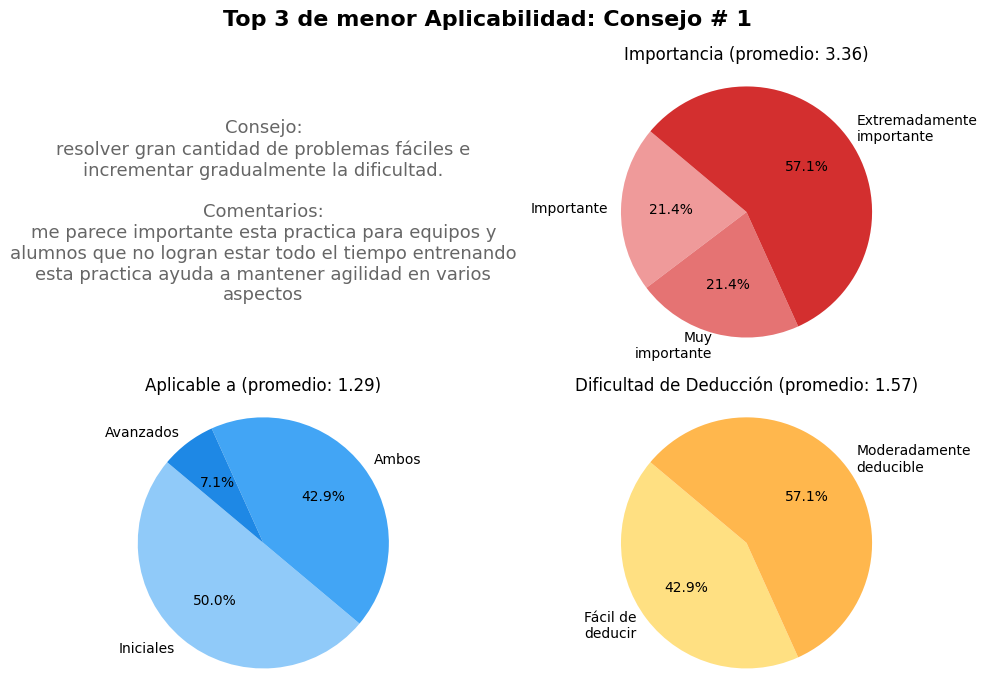

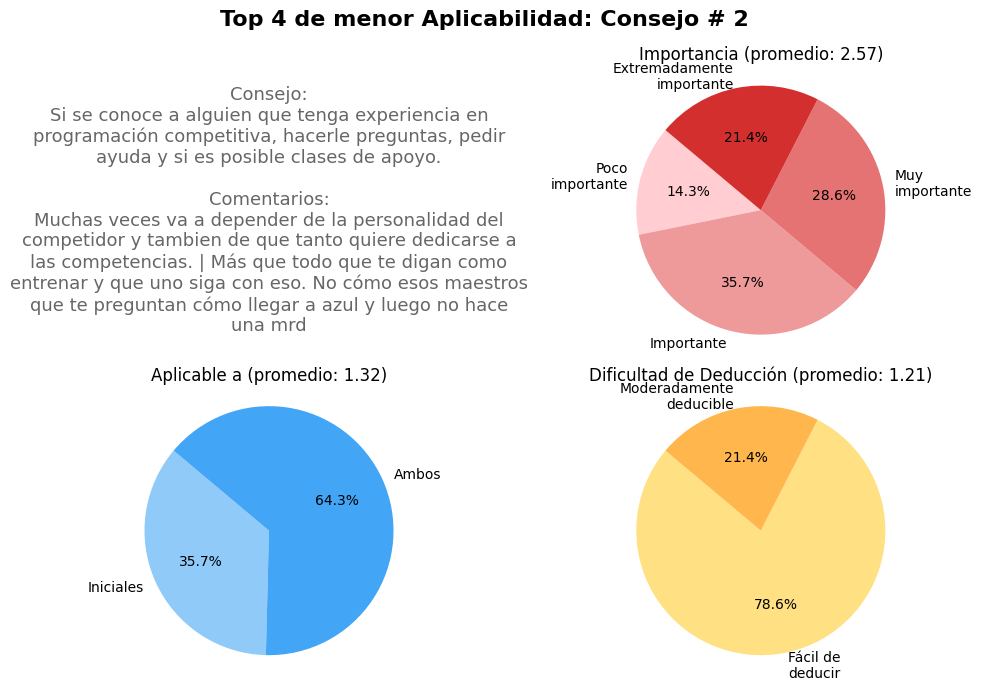

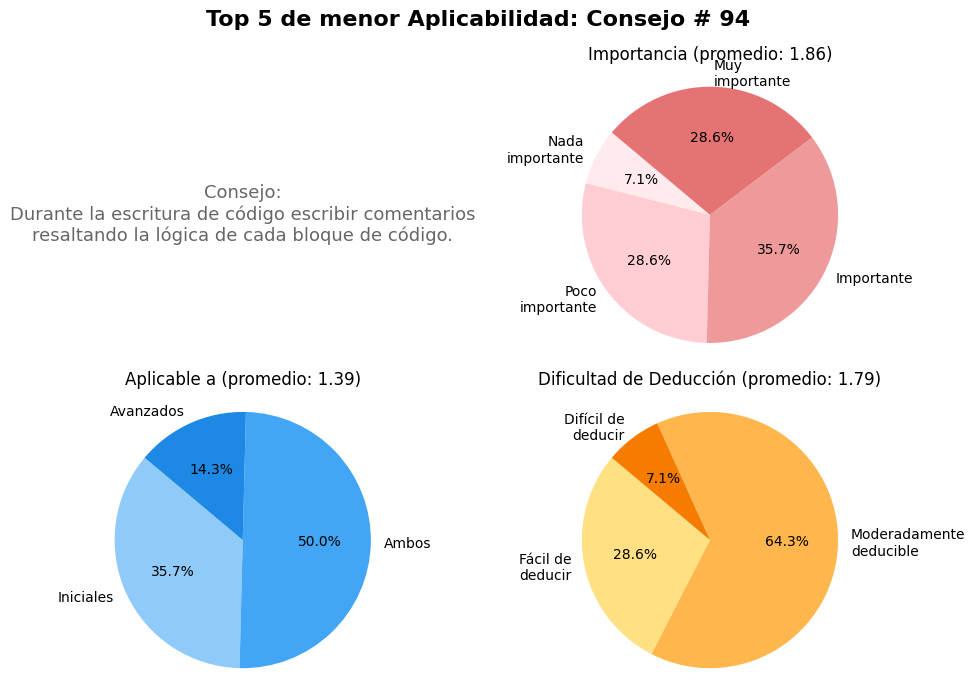

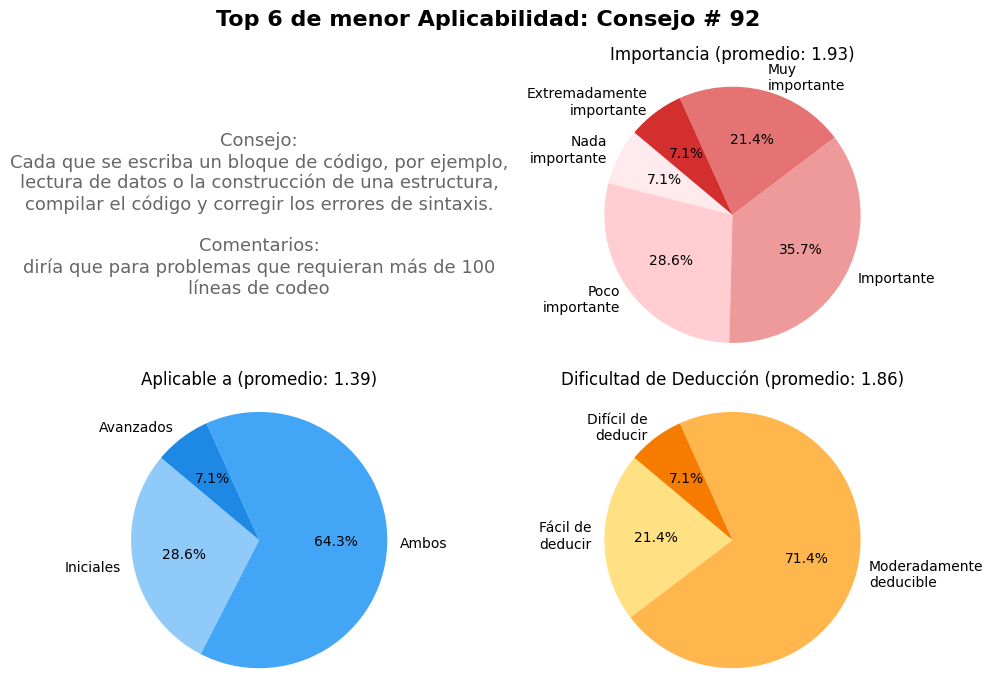

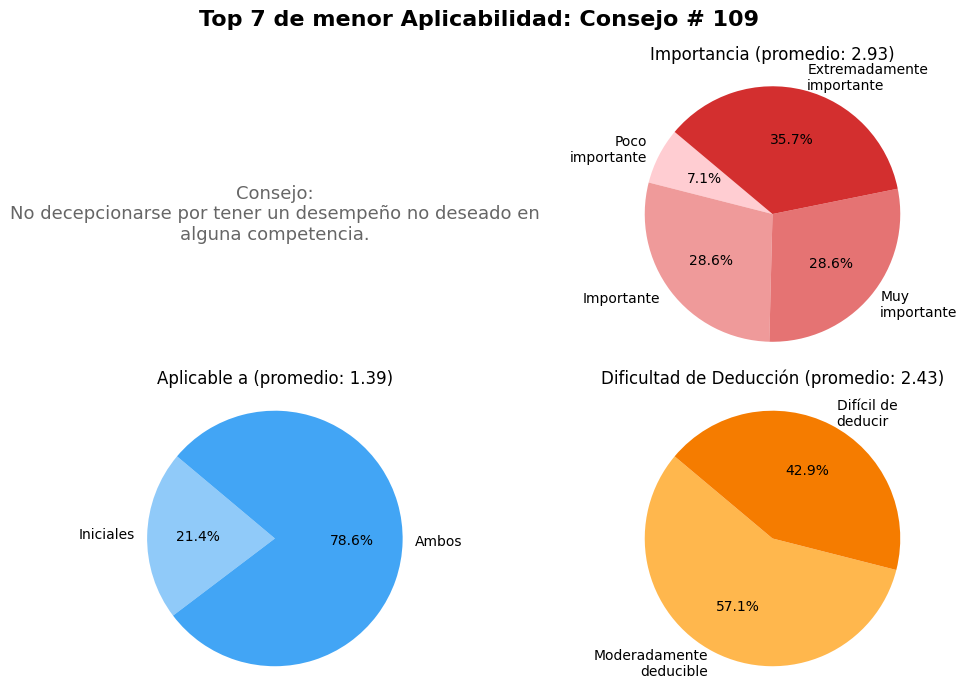

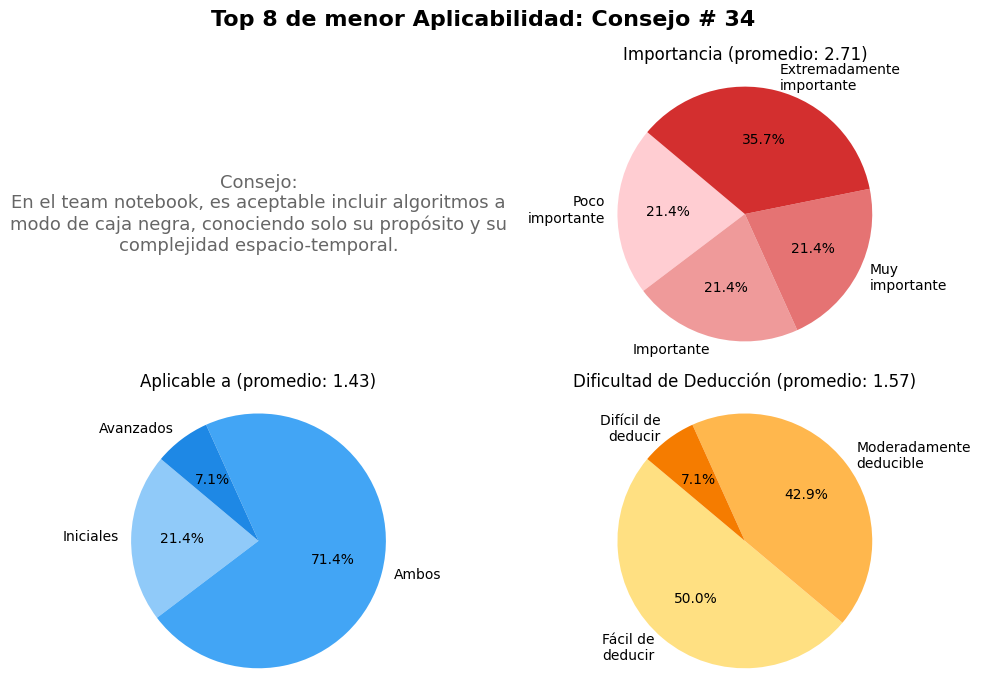

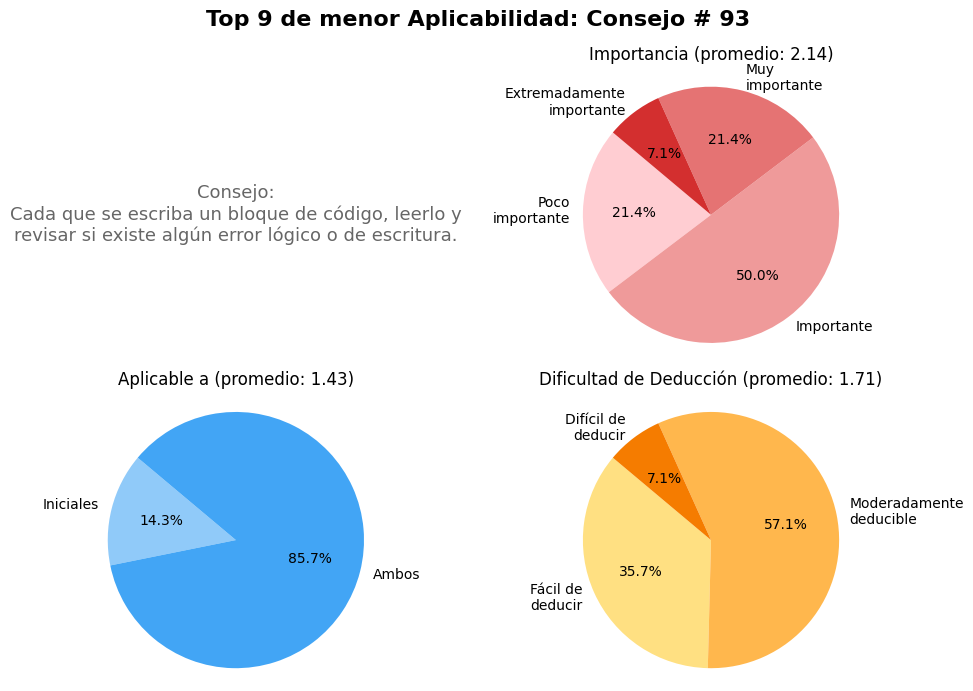

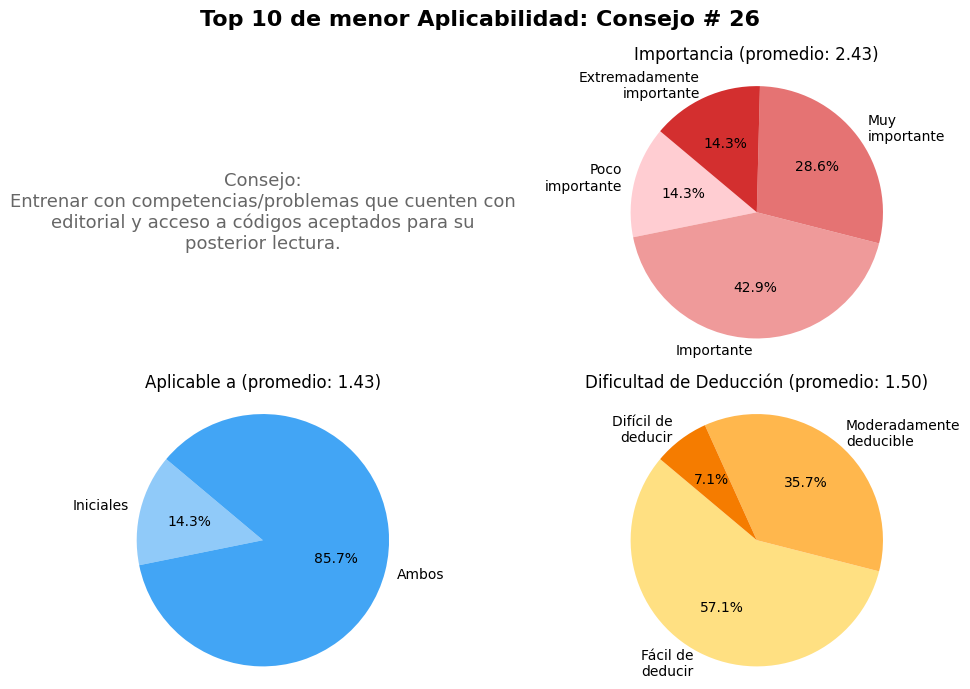

In [19]:
# Top 10 consejos con menor Aplicabilidad Promedio:
plot_top10_advice(advice_data, metric='Aplicabilidad Promedio', extreme="lowest")

In [24]:
def plot_by_ids(advice_data, ids):
    """
    Grafica los consejos que tengan como identificador uno de los valores en la lista `ids`.
    """
    for advice_id in ids:
        subset = advice_data[advice_data['#'] == str(advice_id)]
        if subset.empty:
            print(f"Advertencia: Consejo #{advice_id} no encontrado.")
            continue
        consejo_text = subset.iloc[0].get('Práctica', 'Texto no disponible')
        title_str = f"Consejo # {advice_id}"
        plot_four_quadrants(subset, title_str, consejo_text)


Graficando consejos con IDs: [1, 2, 3, 4, 8, 12, 20, 26, 29, 30, 34, 36, 38, 40, 44, 45, 55, 56, 57, 60, 61, 63, 64, 65, 73, 75, 81, 84, 88, 89, 92, 93, 94, 103, 104, 108, 109, 110, 111, 112]
40 consejos en total.


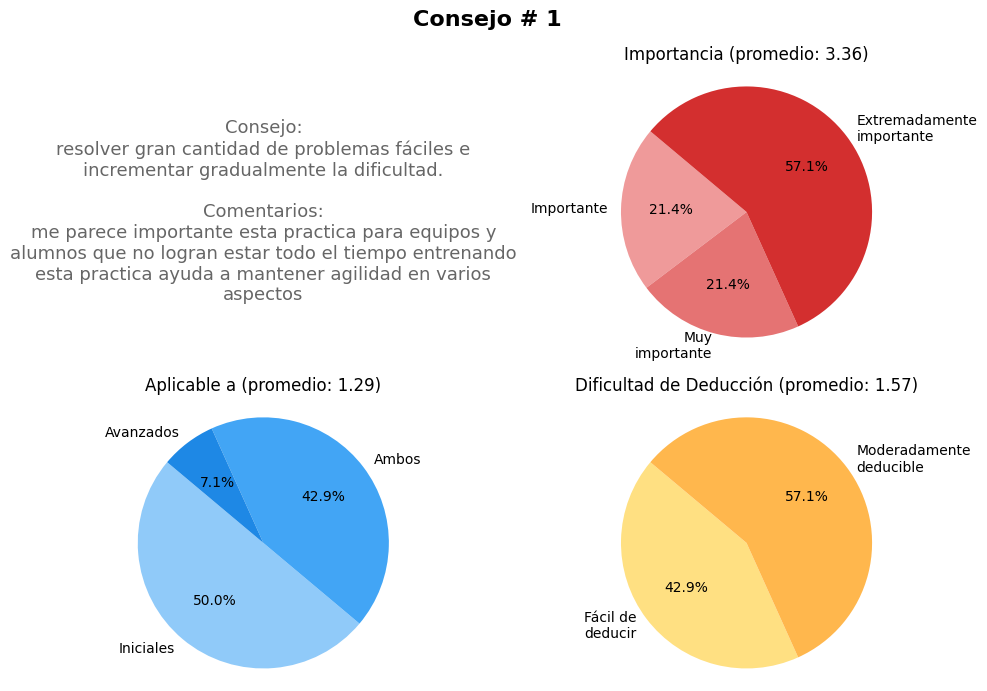

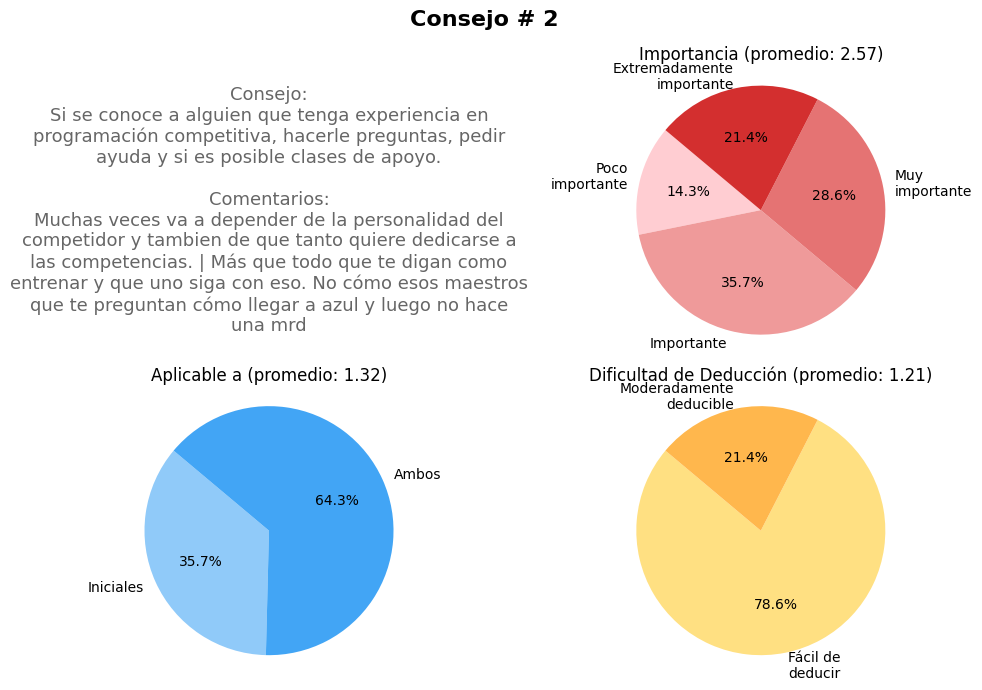

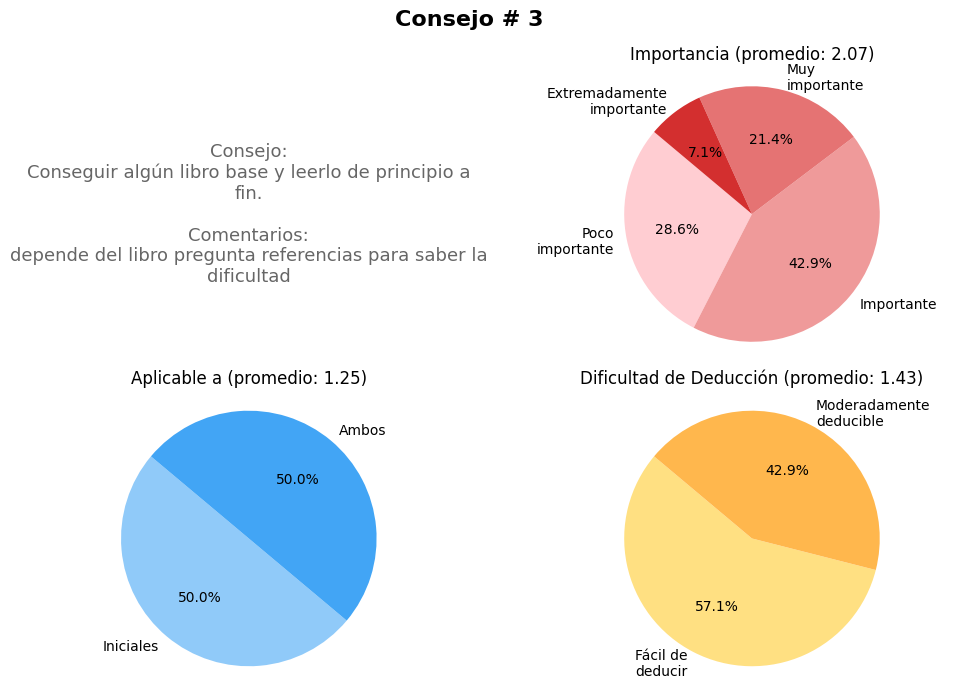

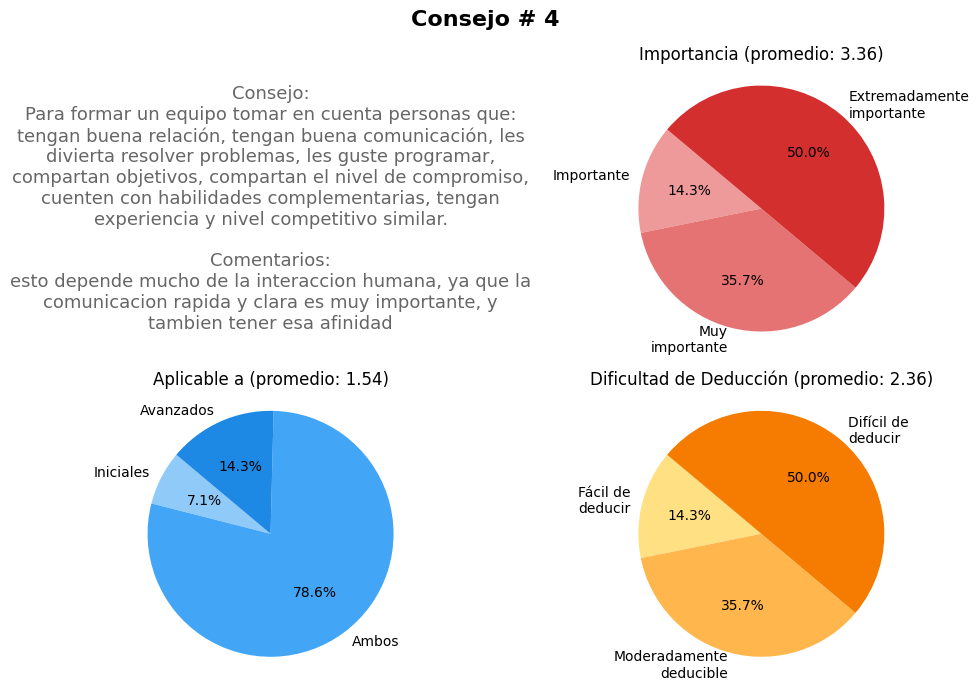

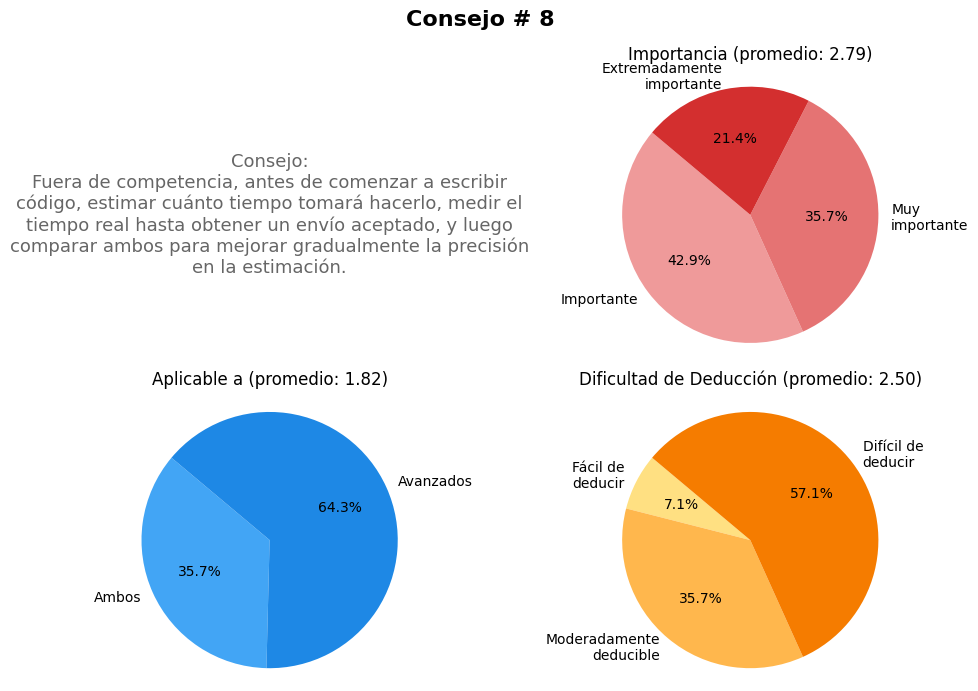

...

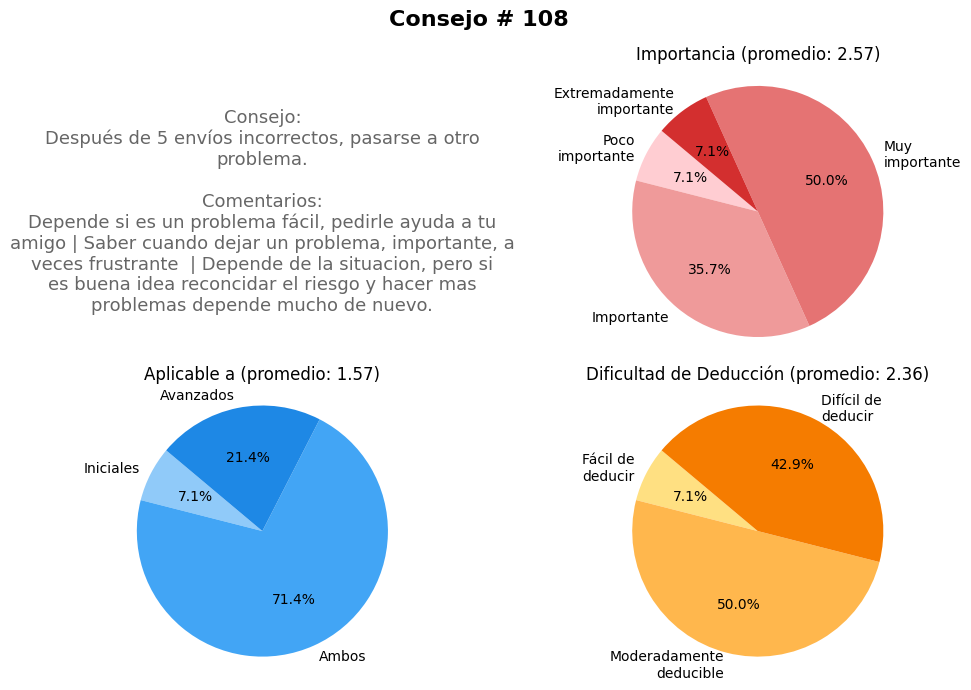

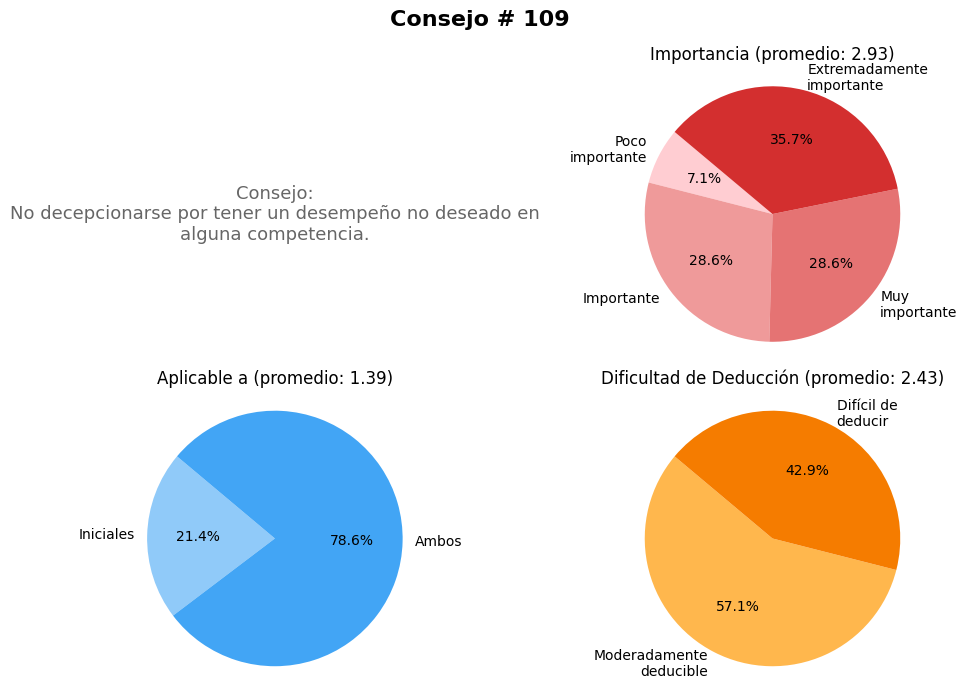

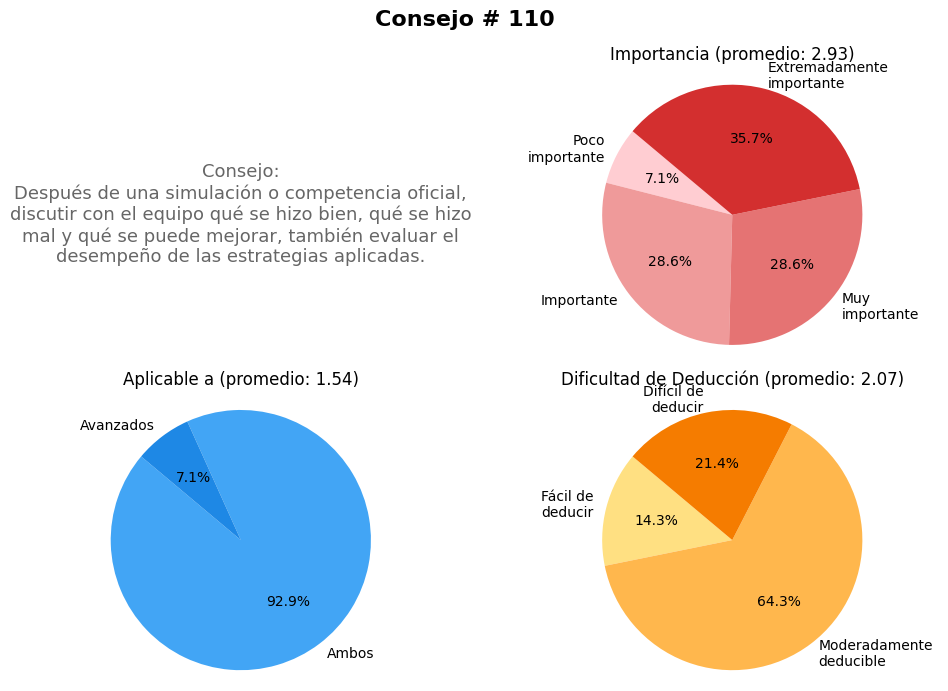

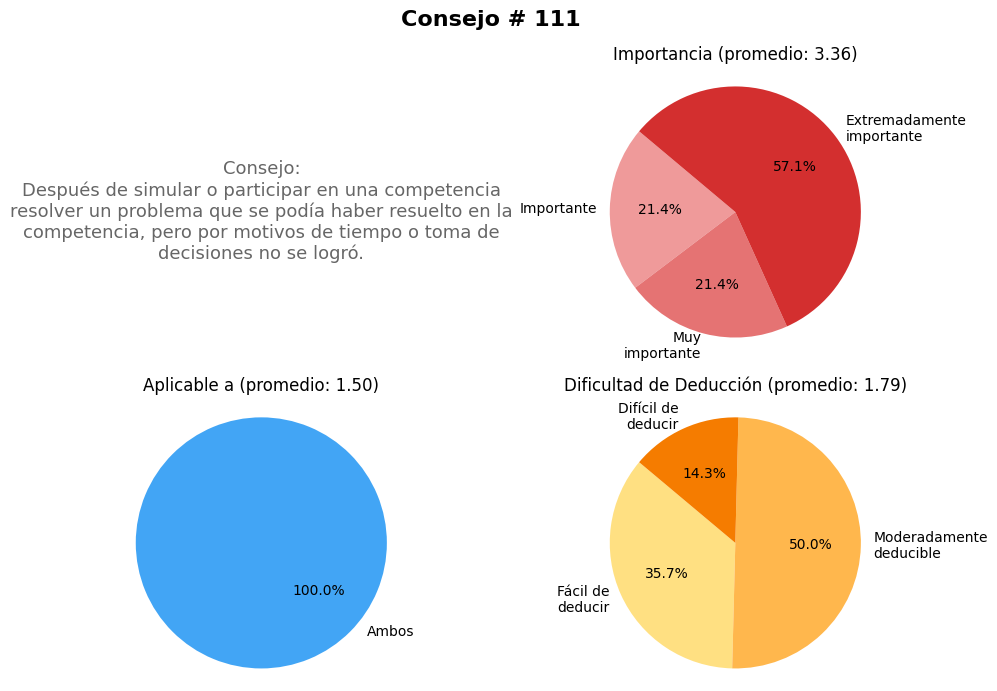

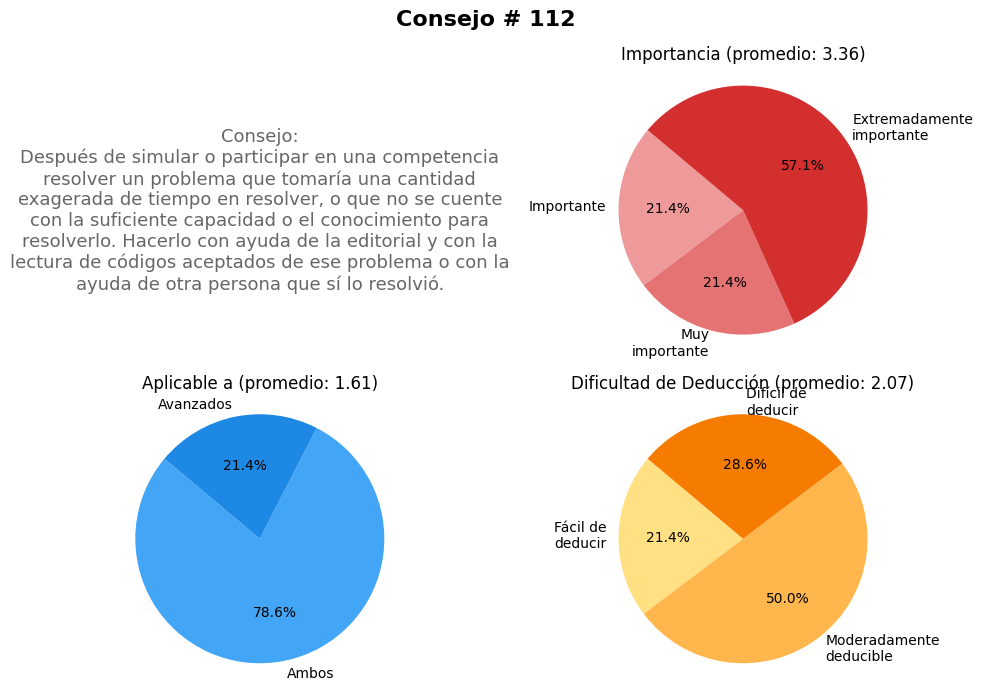

In [25]:
ids = [1, 2, 3, 4, 8, 12, 20, 26, 29, 30, 34, 36, 38, 40, 44, 45, 55, 56, 57, 60, 61, 63, 64, 65, 73, 75, 81, 84, 88, 89, 92, 93, 94, 103, 104, 108, 109, 110, 111, 112]
print(f"Graficando consejos con IDs: {ids}")
print(ids.__len__(), "consejos en total.")
plot_by_ids(advice_data, ids)